# 1. Import Dependencies

In [21]:
from sklearn.cluster import KMeans
import numpy as np
import os
import glob
import librosa

# 4. Data Analysis


In [22]:
#f_npz = np.load("../ViolinEtudes-zenodo-test/anal/with_timestamps/train_set/19Df_oVHUiD5800040118.npz")
f_npz = np.load("../ViolinEtudes-zenodo-downsample_2025/anal/train/02wFsdCE1o4kw00000186.npz")
f_npz, type(f_npz)


(NpzFile '../ViolinEtudes-zenodo-downsample_2025/anal/train/02wFsdCE1o4kw00000186.npz' with keys: time, f0, hfreq, hmag,
 numpy.lib.npyio.NpzFile)

In [23]:
f_npz.keys, "time" in f_npz

(<bound method Mapping.keys of NpzFile '../ViolinEtudes-zenodo-downsample_2025/anal/train/02wFsdCE1o4kw00000186.npz' with keys: time, f0, hfreq, hmag>,
 True)

In [24]:
f_npz['time'].shape

(59046,)

In [25]:
f_npz['time'].shape, f_npz['f0'].shape, f_npz['hfreq'].shape, f_npz['hmag'].shape

((59046,), (59046,), (59046, 25), (59046, 25))

In [26]:
# Find the index of the closest centroid for each data point
closest_centroids = kmeans.predict(data)

# Compute the distance to the closest centroid for each data point
closest_distances = np.empty(len(data))
for i, centroid_index in enumerate(closest_centroids):
    closest_distances[i] = np.linalg.norm(data[i] - kmeans.cluster_centers_[centroid_index])

# Now `closest_distances[i]` is the distance from the i-th data point to its closest centroid.

NameError: name 'kmeans' is not defined

## 4.1. Cluster Centroid Number Histogram

In [18]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Define scaling functions
def standardize_hmags(hmags_all, means, scales):
    return (hmags_all - means) / scales

def minmax_scale_hmags(hmags_all, data_min, data_max):
    return (hmags_all - data_min) / (data_max - data_min)

def normalize_hmags(hmags_all):
    weights = np.linalg.norm(hmags_all, axis=1)
    normalized_hmags = (hmags_all / weights[:, np.newaxis]).astype(np.float32)
    return normalized_hmags, weights

In [19]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Directories containing the CSV files for each scaling method
train_set_dir = '../ViolinEtudes-zenodo-downsample_2025/anal/train'  # Update this to your local path
scaling_methods = ['timbre_cluster_minmax', 'timbre_cluster_normalized', 'timbre_cluster_std']

# Initialize a dictionary to store label counts for each scaling method
label_counts = {method: [] for method in scaling_methods}

# Function to read labels from CSV files in a given directory
def read_labels(directory):
    labels = []
    for file in os.listdir(directory):
        if file.endswith('.csv'):
            file_path = os.path.join(directory, file)
            try:
                data = pd.read_csv(file_path)
                labels.extend(data['labels'].values.astype(int))
            except Exception as e:
                print(f"Error reading {file_path}: {e}")
    return labels

# Read labels for each scaling method
for method in scaling_methods:
    dir_path = os.path.join(train_set_dir, method)
    label_counts[method] = read_labels(dir_path)

FileNotFoundError: [Errno 2] No such file or directory: '../ViolinEtudes-zenodo-downsample_2025/anal/train/timbre_cluster_minmax'

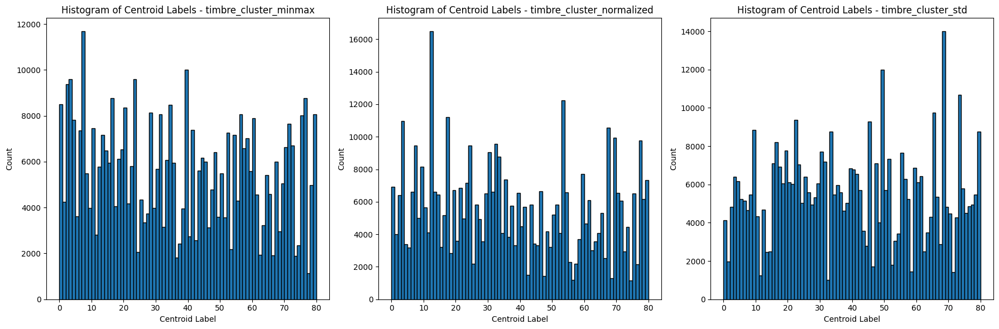

In [2]:
plt.figure(figsize=(18, 6))
for i, method in enumerate(scaling_methods, 1):
    plt.subplot(1, 3, i)
    plt.hist(label_counts[method], bins=range(max(label_counts[method]) + 2), edgecolor='k')
    plt.title(f"Histogram of Centroid Labels - {method}")
    plt.xlabel("Centroid Label")
    plt.ylabel("Count")
plt.tight_layout()
plt.show()
# # Plot histograms for the label counts of each scaling method
# plt.figure(figsize=(8, 14))
# for i, method in enumerate(scaling_methods, 1):
#     plt.subplot(3, 1, i)
#     plt.hist(label_counts[method], bins=range(max(label_counts[method]) + 2), edgecolor='k')
#     plt.title(f"Histogram of Centroid Labels - {method}")
#     plt.xlabel("Centroid Label")
#     plt.ylabel("Count")
# plt.tight_layout()
# plt.show()

## 4.2. 2D Projection Plot for Centroid Distance

In [27]:
# Load the centroids and standardization stats files
statistics_dir = '../ViolinEtudes-zenodo-test/timbre_cluster/statistics'
centroids_minmax_path = statistics_dir + '/timbre_cluster_minmax/centroids_minmax.csv'
centroids_normalized_path = statistics_dir + '/timbre_cluster_normalized/centroids_normalized.csv'
centroids_std_path = statistics_dir + '/timbre_cluster_std/centroids_std.csv'

standardization_stats_path = statistics_dir + '/timbre_cluster_std/standardization_stats.csv'
minmax_stats_path = statistics_dir + '/timbre_cluster_minmax/minmax_stats.csv'

centroids_minmax = pd.read_csv(centroids_minmax_path).iloc[:, :25]
centroids_normalized = pd.read_csv(centroids_normalized_path).iloc[:, :25]
centroids_std = pd.read_csv(centroids_std_path).iloc[:, :25]
standardization_stats = pd.read_csv(standardization_stats_path)
minmax_stats = pd.read_csv(minmax_stats_path)

# Extract standardization stats
means = standardization_stats['mean'].values
scales = standardization_stats['scale'].values

# Extract min and max for Min-Max scaling
data_min = minmax_stats['data_min'].values
data_max = minmax_stats['data_max'].values

FileNotFoundError: [Errno 2] No such file or directory: '../ViolinEtudes-zenodo-test/timbre_cluster/statistics/timbre_cluster_minmax/centroids_minmax.csv'

In [5]:
# Load npz files and apply scaling methods
npz_dir = '../ViolinEtudes-zenodo-test/anal/with_timestamps/train_set'
hmag_list = []
hmag_standardized_list = []
hmag_minmax_list = []
hmag_normalized_list = []

for file in os.listdir(npz_dir):
    if file.endswith('.npz'):
        file_path = os.path.join(npz_dir, file)
        data = np.load(file_path)
        hmag = data['hmag']

        hmag_list.append(hmag)
        hmag_standardized_list.append(standardize_hmags(hmag, means, scales))
        hmag_minmax_list.append(minmax_scale_hmags(hmag, data_min, data_max))
        hmag_normalized_list.append(normalize_hmags(hmag)[0])

In [6]:
# Combine all data
hmag_standardized = np.vstack(hmag_standardized_list)
hmag_minmax = np.vstack(hmag_minmax_list)
hmag_normalized = np.vstack(hmag_normalized_list)

# Perform PCA for Standardized
pca_standardized = PCA(n_components=2)
hmag_standardized_pca = pca_standardized.fit_transform(hmag_standardized)
centroids_std_pca = pca_standardized.transform(centroids_std)

# Perform PCA for Min-Max Scaled
pca_minmax = PCA(n_components=2)
hmag_minmax_pca = pca_minmax.fit_transform(hmag_minmax)
centroids_minmax_pca = pca_minmax.transform(centroids_minmax)

# Perform PCA for Normalized
pca_normalized = PCA(n_components=2)
hmag_normalized_pca = pca_normalized.fit_transform(hmag_normalized)
centroids_normalized_pca = pca_normalized.transform(centroids_normalized)

/Users/qinliu/anaconda3/envs/Ching/lib/python3.9/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(
/Users/qinliu/anaconda3/envs/Ching/lib/python3.9/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(
/Users/qinliu/anaconda3/envs/Ching/lib/python3.9/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


### a. PCA

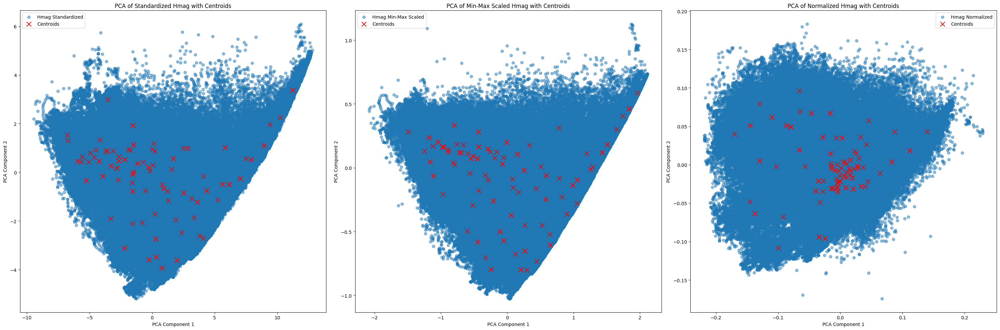

In [7]:
# Plot PCA results
plt.figure(figsize=(30, 10))

# Standardized
plt.subplot(1, 3, 1)
plt.scatter(hmag_standardized_pca[:, 0], hmag_standardized_pca[:, 1], alpha=0.5, label='Hmag Standardized')
plt.scatter(centroids_std_pca[:, 0], centroids_std_pca[:, 1], color='red', marker='x', s=100, label='Centroids')
plt.title('PCA of Standardized Hmag with Centroids')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()

# Min-Max Scaled
plt.subplot(1, 3, 2)
plt.scatter(hmag_minmax_pca[:, 0], hmag_minmax_pca[:, 1], alpha=0.5, label='Hmag Min-Max Scaled')
plt.scatter(centroids_minmax_pca[:, 0], centroids_minmax_pca[:, 1], color='red', marker='x', s=100, label='Centroids')
plt.title('PCA of Min-Max Scaled Hmag with Centroids')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()

# Normalized
plt.subplot(1, 3, 3)
plt.scatter(hmag_normalized_pca[:, 0], hmag_normalized_pca[:, 1], alpha=0.5, label='Hmag Normalized')
plt.scatter(centroids_normalized_pca[:, 0], centroids_normalized_pca[:, 1], color='red', marker='x', s=100, label='Centroids')
plt.title('PCA of Normalized Hmag with Centroids')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()

plt.tight_layout()
plt.show()

### b. t-SNE

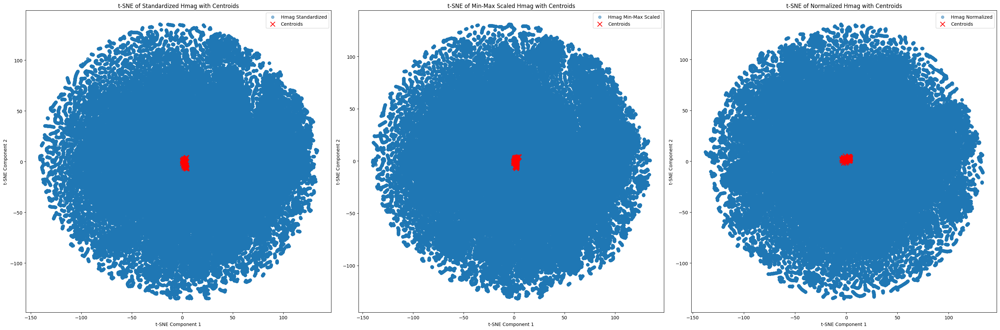

In [187]:
from sklearn.manifold import TSNE
# Perform t-SNE for Standardized
tsne_standardized = TSNE(n_components=2, random_state=42)
hmag_standardized_tsne = tsne_standardized.fit_transform(hmag_standardized)
centroids_std_tsne = tsne_standardized.fit_transform(centroids_std)

# Perform t-SNE for Min-Max Scaled
tsne_minmax = TSNE(n_components=2, random_state=42)
hmag_minmax_tsne = tsne_minmax.fit_transform(hmag_minmax)
centroids_minmax_tsne = tsne_minmax.fit_transform(centroids_minmax)

# Perform t-SNE for Normalized
tsne_normalized = TSNE(n_components=2, random_state=42)
hmag_normalized_tsne = tsne_normalized.fit_transform(hmag_normalized)
centroids_normalized_tsne = tsne_normalized.fit_transform(centroids_normalized)

# Plot t-SNE results
plt.figure(figsize=(30, 10))

# Standardized
plt.subplot(1, 3, 1)
plt.scatter(hmag_standardized_tsne[:, 0], hmag_standardized_tsne[:, 1], alpha=0.5, label='Hmag Standardized')
plt.scatter(centroids_std_tsne[:, 0], centroids_std_tsne[:, 1], color='red', marker='x', s=100, label='Centroids')
plt.title('t-SNE of Standardized Hmag with Centroids')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend()

# Min-Max Scaled
plt.subplot(1, 3, 2)
plt.scatter(hmag_minmax_tsne[:, 0], hmag_minmax_tsne[:, 1], alpha=0.5, label='Hmag Min-Max Scaled')
plt.scatter(centroids_minmax_tsne[:, 0], centroids_minmax_tsne[:, 1], color='red', marker='x', s=100, label='Centroids')
plt.title('t-SNE of Min-Max Scaled Hmag with Centroids')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend()

# Normalized
plt.subplot(1, 3, 3)
plt.scatter(hmag_normalized_tsne[:, 0], hmag_normalized_tsne[:, 1], alpha=0.5, label='Hmag Normalized')
plt.scatter(centroids_normalized_tsne[:, 0], centroids_normalized_tsne[:, 1], color='red', marker='x', s=100, label='Centroids')
plt.title('t-SNE of Normalized Hmag with Centroids')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend()

plt.tight_layout()
plt.show()

## 4.3. 25 Harmonic Distribution
x: hmag value, y: occurence

In [7]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
# Load npz files and apply scaling methods
npz_dir = '../ViolinEtudes-zenodo-test/anal/with_timestamps/train_set'
npz_dir = '../ViolinEtudes-zenodo-downsample_2025/anal/crepe/'
hmag_list = []


for file in os.listdir(npz_dir):
    if file.endswith('.npz'):
        file_path = os.path.join(npz_dir, file)
        data = np.load(file_path)
        hmag = data['hmag']

        hmag_list.append(hmag)


# Combine all data
hmag_combined = np.vstack(hmag_list)

In [11]:
len(hmag_list), hmag_list[1].shape, type(hmag_list[1]), hmag_list[1].shape

(37, (12834, 25), numpy.ndarray, (12834, 25))

In [13]:
hmag_combined.shape

(1165192, 25)

In [123]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define function to plot histograms with KDE for each harmonic magnitude
def plot_histograms_with_kde(hmag_data, title):
    plt.figure(figsize=(20, 20))
    for i in range(25):
        plt.subplot(5, 5, i+1)
        #filtered_data = hmag_data[hmag_data[:, i] != -100, i]  # Filter out values equal to -100
        #filtered_data = hmag_data
        filtered_data = hmag_data[~np.isnan(hmag_data[:, i]), i]  # Filter out NaN values
        sns.histplot(filtered_data, kde=True, bins=30)
        plt.title(f'Harmonic {i+1}')
        plt.xlabel('Magnitude')
        plt.ylabel('Frequency')
    plt.suptitle(title)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# Define function to calculate and print skewness
def calculate_skewness(hmag_data, title):
    skewness_values = []
    for i in range(25):
        #filtered_data = hmag_data[hmag_data[:, i] != -100, i]  # Filter out values equal to -100
        filtered_data = hmag_data[~np.isnan(hmag_data[:, i]), i]  # Filter out NaN values
        skewness = stats.skew(filtered_data, nan_policy='omit')
        skewness_values.append(skewness)
        print(f'Harmonic {i+1} Skewness: {skewness:.4f}')
    avg_skewness = np.mean(skewness_values)
    print(f'Average Skewness for {title}: {avg_skewness:.4f}')

In [20]:
# Filter out the clipped value -100
hmag_filtered = np.where(hmag_combined == -100, np.nan, hmag_combined)

# Ensure that -100 values are properly filtered out
print("Checking for -100 values in the filtered data:", np.any(hmag_filtered == -100))
# Remove the clipped value -100
#hmag_filtered = np.array([row[row != -100] for row in hmag_combined])

Checking for -100 values in the filtered data: False


In [53]:
np.nanmin(hmag_filtered)

-89.99958657750946

### 4.3.1. Original hmag Distribution

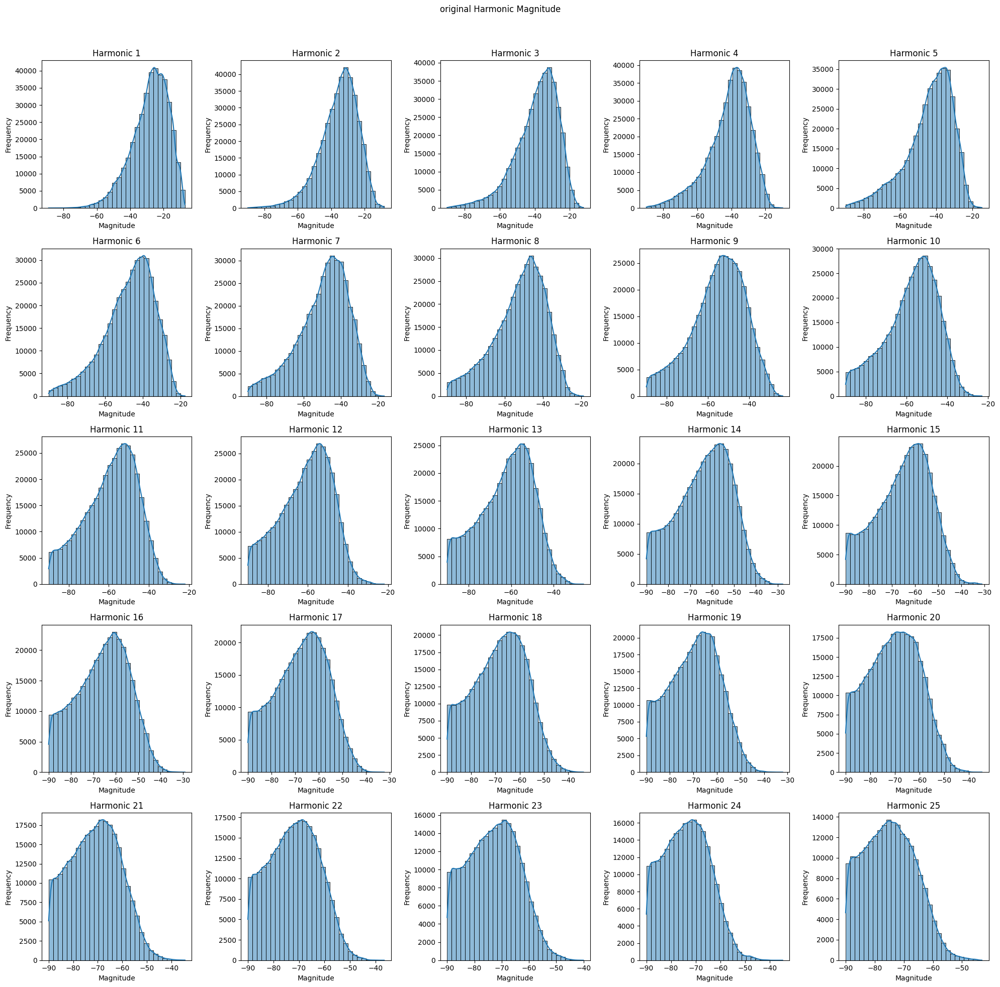

In [125]:
# Plot original data
plot_histograms_with_kde(hmag_filtered, "original Harmonic Magnitude")

In [126]:
calculate_skewness(hmag_filtered, "original Harmonic Magnitude")

Harmonic 1 Skewness: -0.7316
Harmonic 2 Skewness: -0.8042
Harmonic 3 Skewness: -0.9283
Harmonic 4 Skewness: -0.8548
Harmonic 5 Skewness: -0.9086
Harmonic 6 Skewness: -0.6885
Harmonic 7 Skewness: -0.6602
Harmonic 8 Skewness: -0.6034
Harmonic 9 Skewness: -0.4748
Harmonic 10 Skewness: -0.5015
Harmonic 11 Skewness: -0.4044
Harmonic 12 Skewness: -0.3278
Harmonic 13 Skewness: -0.3374
Harmonic 14 Skewness: -0.2703
Harmonic 15 Skewness: -0.2785
Harmonic 16 Skewness: -0.1762
Harmonic 17 Skewness: -0.1505
Harmonic 18 Skewness: -0.1035
Harmonic 19 Skewness: -0.0532
Harmonic 20 Skewness: 0.0171
Harmonic 21 Skewness: 0.0890
Harmonic 22 Skewness: 0.0665
Harmonic 23 Skewness: 0.0967
Harmonic 24 Skewness: 0.1886
Harmonic 25 Skewness: 0.2356
Average Skewness for original Harmonic Magnitude: -0.3426


### 4.3.2. Transformations for Normal Distribution

#### a. Exponential Transformation 

In [38]:
hmag_filtered.shape, hmag_exp_transformed.shape

((388830, 25), (388830, 25))

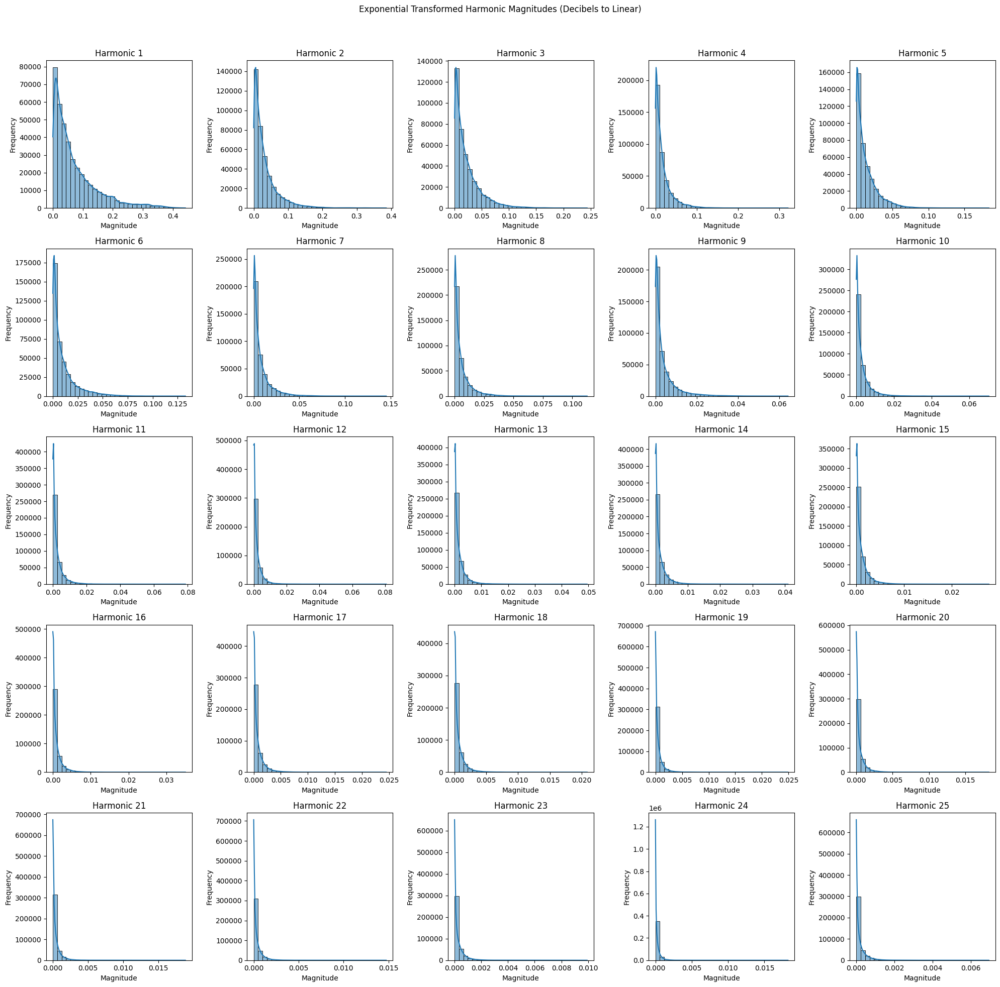

Harmonic 1 Skewness: 1.6806
Harmonic 2 Skewness: 2.6235
Harmonic 3 Skewness: 2.1259
Harmonic 4 Skewness: 2.5951
Harmonic 5 Skewness: 2.2890
Harmonic 6 Skewness: 2.2649
Harmonic 7 Skewness: 2.6839
Harmonic 8 Skewness: 2.8322
Harmonic 9 Skewness: 2.8661
Harmonic 10 Skewness: 3.2009
Harmonic 11 Skewness: 3.3158
Harmonic 12 Skewness: 4.5074
Harmonic 13 Skewness: 3.4263
Harmonic 14 Skewness: 3.4475
Harmonic 15 Skewness: 4.0222
Harmonic 16 Skewness: 3.6469
Harmonic 17 Skewness: 3.4131
Harmonic 18 Skewness: 3.9924
Harmonic 19 Skewness: 4.0390
Harmonic 20 Skewness: 4.0759
Harmonic 21 Skewness: 5.8851
Harmonic 22 Skewness: 4.1765
Harmonic 23 Skewness: 4.2441
Harmonic 24 Skewness: 5.8595
Harmonic 25 Skewness: 5.1046
Average Skewness for Exponential Transformed Harmonic Magnitudes (Decibels to Linear): 3.5327


In [36]:
# Exponential Transformation (decibels to linear)
hmag_exp_transformed = np.zeros_like(hmag_filtered)
for i in range(hmag_filtered.shape[1]):
    hmag_exp_transformed[~np.isnan(hmag_filtered[:, i]), i] = 10 ** (hmag_filtered[~np.isnan(hmag_filtered[:, i]), i] / 20.0)

# Plot Exponential Transformed data
plot_histograms_with_kde(hmag_exp_transformed, 'Exponential Transformed Harmonic Magnitudes (Decibels to Linear)')

# Calculate skewness for Exponential Transformed data
calculate_skewness(hmag_exp_transformed, 'Exponential Transformed Harmonic Magnitudes (Decibels to Linear)')

#### b. Square Transformation
Square transformation emphasizes larger values more and can help spread out a compressed distribution.
$$Y^{\prime}=(Y-\min (Y)+1)^2$$

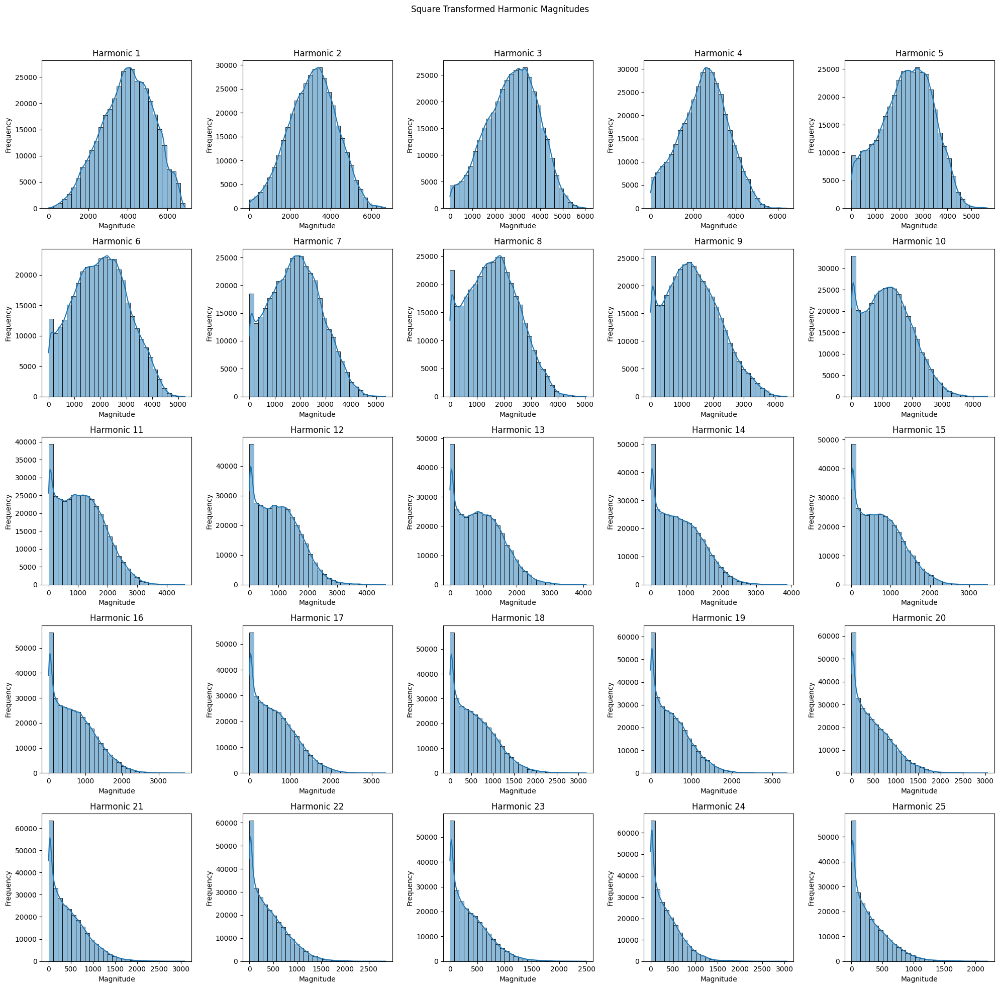

Harmonic 1 Skewness: -0.2272
Harmonic 2 Skewness: -0.0911
Harmonic 3 Skewness: -0.1860
Harmonic 4 Skewness: -0.0836
Harmonic 5 Skewness: -0.1552
Harmonic 6 Skewness: 0.0892
Harmonic 7 Skewness: 0.1516
Harmonic 8 Skewness: 0.2123
Harmonic 9 Skewness: 0.3912
Harmonic 10 Skewness: 0.3543
Harmonic 11 Skewness: 0.4283
Harmonic 12 Skewness: 0.5530
Harmonic 13 Skewness: 0.5305
Harmonic 14 Skewness: 0.5934
Harmonic 15 Skewness: 0.6270
Harmonic 16 Skewness: 0.7138
Harmonic 17 Skewness: 0.7496
Harmonic 18 Skewness: 0.8379
Harmonic 19 Skewness: 0.9015
Harmonic 20 Skewness: 0.9688
Harmonic 21 Skewness: 1.1334
Harmonic 22 Skewness: 1.0530
Harmonic 23 Skewness: 1.1300
Harmonic 24 Skewness: 1.3191
Harmonic 25 Skewness: 1.3588
Average Skewness for Square Transformed Harmonic Magnitudes: 0.5341


In [66]:
# Square Transformation
# Adjust the small constant added to avoid clipping
epsilon = 1e-6
# Square Transformation with adjusted constant
hmag_square_transformed = (hmag_filtered - np.nanmin(hmag_filtered) + epsilon) ** 2

# Plot Square Transformed data
plot_histograms_with_kde(hmag_square_transformed, 'Square Transformed Harmonic Magnitudes')
calculate_skewness(hmag_square_transformed, 'Square Transformed Harmonic Magnitudes')

# hmag_square_transformed = (hmag_filtered - np.nanmin(hmag_filtered) + 1) ** 2
# plot_histograms_with_kde(hmag_square_transformed, 'Square Transformed Harmonic Magnitudes')
# calculate_skewness(hmag_square_transformed, 'Square Transformed Harmonic Magnitudes')

#### c. Box-Cox Transformation
- A family of power transformations that can handle both positive and negative skewness.
- Formula: $Y^{\prime}=\frac{\left(Y^\lambda-1\right)}{\lambda} \text { for } \lambda \neq 0$
- Note: Requires determining an optimal lambda value.

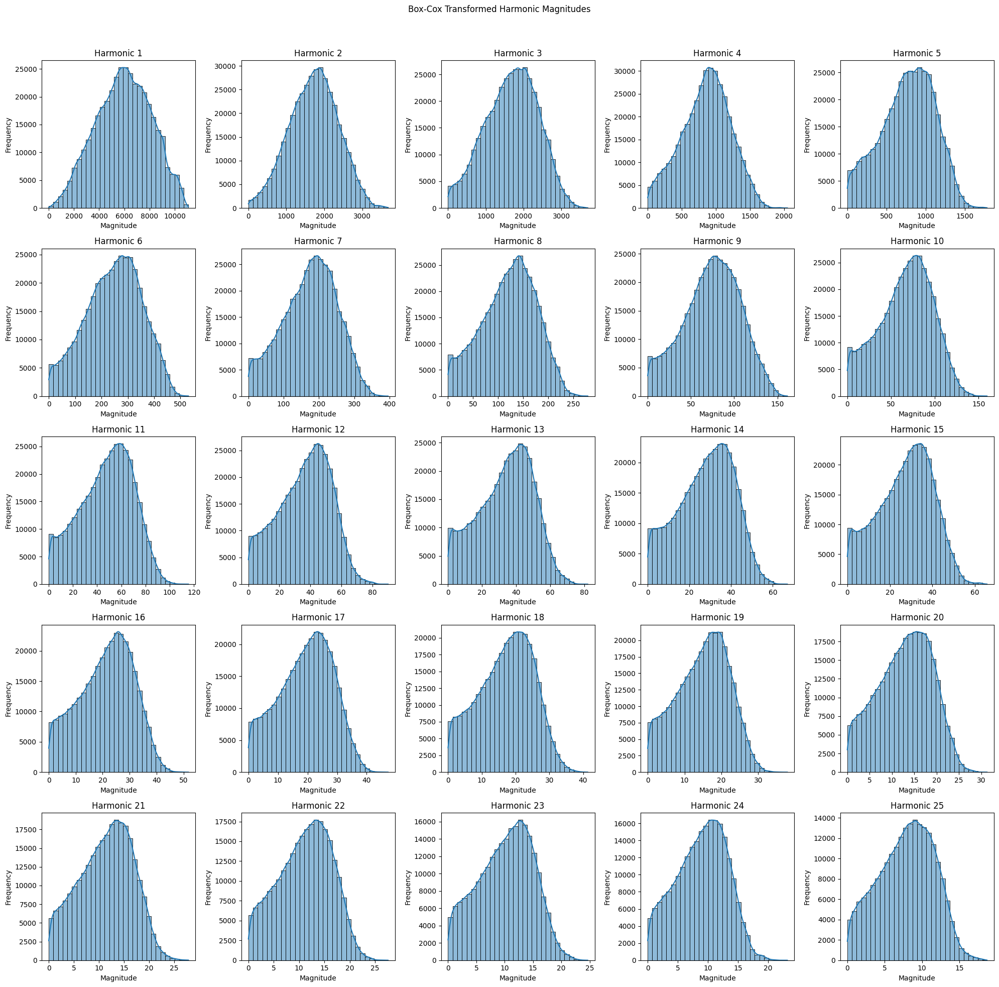

Harmonic 1 Skewness: -0.1055
Harmonic 2 Skewness: -0.0926
Harmonic 3 Skewness: -0.1730
Harmonic 4 Skewness: -0.1733
Harmonic 5 Skewness: -0.2468
Harmonic 6 Skewness: -0.2092
Harmonic 7 Skewness: -0.2292
Harmonic 8 Skewness: -0.2410
Harmonic 9 Skewness: -0.2079
Harmonic 10 Skewness: -0.2506
Harmonic 11 Skewness: -0.2511
Harmonic 12 Skewness: -0.2432
Harmonic 13 Skewness: -0.2610
Harmonic 14 Skewness: -0.2473
Harmonic 15 Skewness: -0.2427
Harmonic 16 Skewness: -0.2288
Harmonic 17 Skewness: -0.2182
Harmonic 18 Skewness: -0.2111
Harmonic 19 Skewness: -0.2019
Harmonic 20 Skewness: -0.1871
Harmonic 21 Skewness: -0.1711
Harmonic 22 Skewness: -0.1784
Harmonic 23 Skewness: -0.1747
Harmonic 24 Skewness: -0.1547
Harmonic 25 Skewness: -0.1465
Average Skewness for Box-Cox Transformed Harmonic Magnitudes: -0.2019


In [60]:
# Box-Cox Transformation
#hmag_boxcox_transformed = np.zeros_like(hmag_filtered)
hmag_boxcox_transformed = np.full_like(hmag_filtered, np.nan)
for i in range(hmag_filtered.shape[1]):
    positive_data = hmag_filtered[~np.isnan(hmag_filtered[:, i]), i] - np.nanmin(hmag_filtered[:, i]) + 1
    hmag_boxcox_transformed[~np.isnan(hmag_filtered[:, i]), i], _ = stats.boxcox(positive_data)
plot_histograms_with_kde(hmag_boxcox_transformed, 'Box-Cox Transformed Harmonic Magnitudes')
calculate_skewness(hmag_boxcox_transformed, 'Box-Cox Transformed Harmonic Magnitudes')

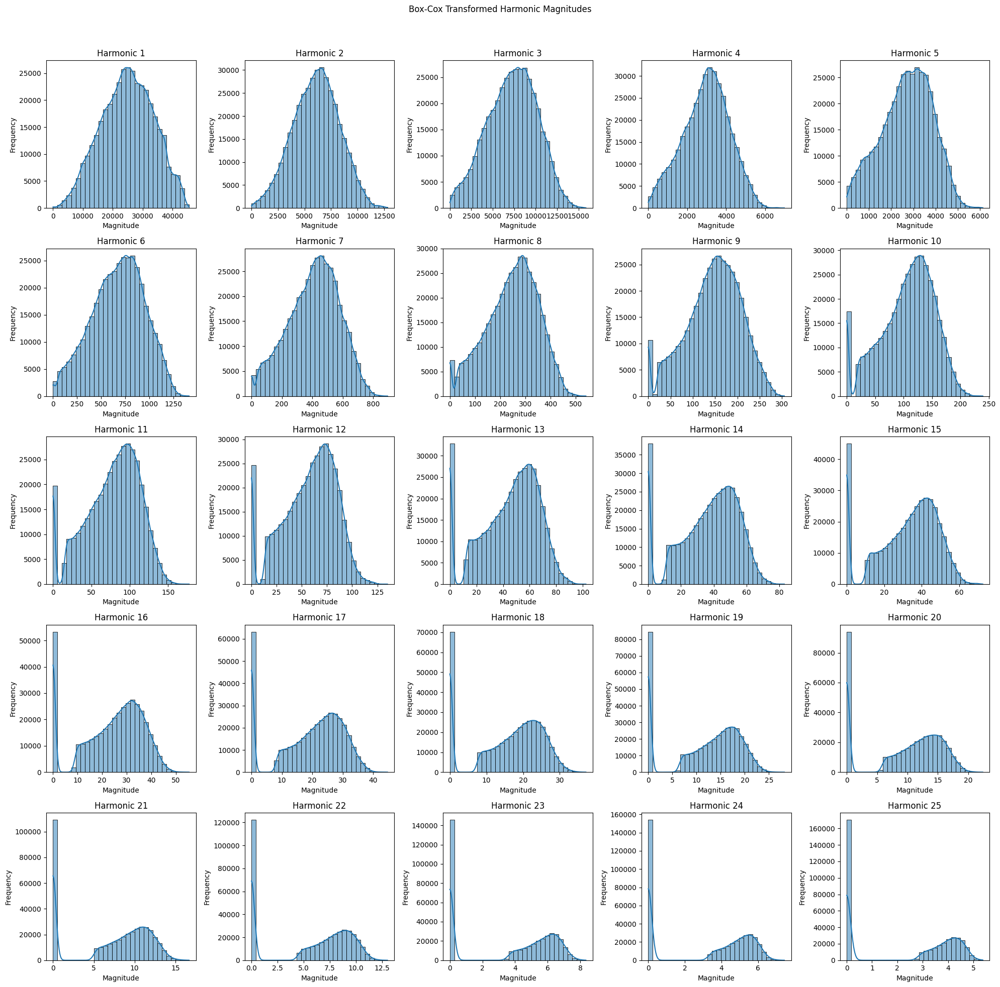

Harmonic 1 Skewness: -0.1056
Harmonic 2 Skewness: -0.0819
Harmonic 3 Skewness: -0.1524
Harmonic 4 Skewness: -0.1685
Harmonic 5 Skewness: -0.2514
Harmonic 6 Skewness: -0.2241
Harmonic 7 Skewness: -0.2851
Harmonic 8 Skewness: -0.3497
Harmonic 9 Skewness: -0.3576
Harmonic 10 Skewness: -0.4801
Harmonic 11 Skewness: -0.4696
Harmonic 12 Skewness: -0.4840
Harmonic 13 Skewness: -0.5526
Harmonic 14 Skewness: -0.5581
Harmonic 15 Skewness: -0.6014
Harmonic 16 Skewness: -0.5884
Harmonic 17 Skewness: -0.6075
Harmonic 18 Skewness: -0.5972
Harmonic 19 Skewness: -0.5778
Harmonic 20 Skewness: -0.5462
Harmonic 21 Skewness: -0.4918
Harmonic 22 Skewness: -0.4399
Harmonic 23 Skewness: -0.3077
Harmonic 24 Skewness: -0.2503
Harmonic 25 Skewness: -0.1339
Average Skewness for Box-Cox Transformed Harmonic Magnitudes: -0.3865


In [70]:
# Ensure all values are positive by adding a constant shift if necessary
min_val = np.min(hmag_combined)
if min_val <= 0:
    hmag_combined_shifted = hmag_combined - min_val + 1
else:
    hmag_combined_shifted = hmag_combined

# Box-Cox Transformation
hmag_boxcox_transformed = np.zeros_like(hmag_combined_shifted)
for i in range(hmag_combined_shifted.shape[1]):
    hmag_boxcox_transformed[:, i], _ = stats.boxcox(hmag_combined_shifted[:, i])

# Plot Box-Cox Transformed data
plot_histograms_with_kde(hmag_boxcox_transformed, 'Box-Cox Transformed Harmonic Magnitudes')

# Calculate skewness for Box-Cox Transformed data
calculate_skewness(hmag_boxcox_transformed, 'Box-Cox Transformed Harmonic Magnitudes')

#### d. Log Transformation
- Effective for reducing skewness.
- Formula: $Y^{\prime}=\log (Y-\min (Y)+1)$
- Note: Ensure all values are positive before applying the log transformation.

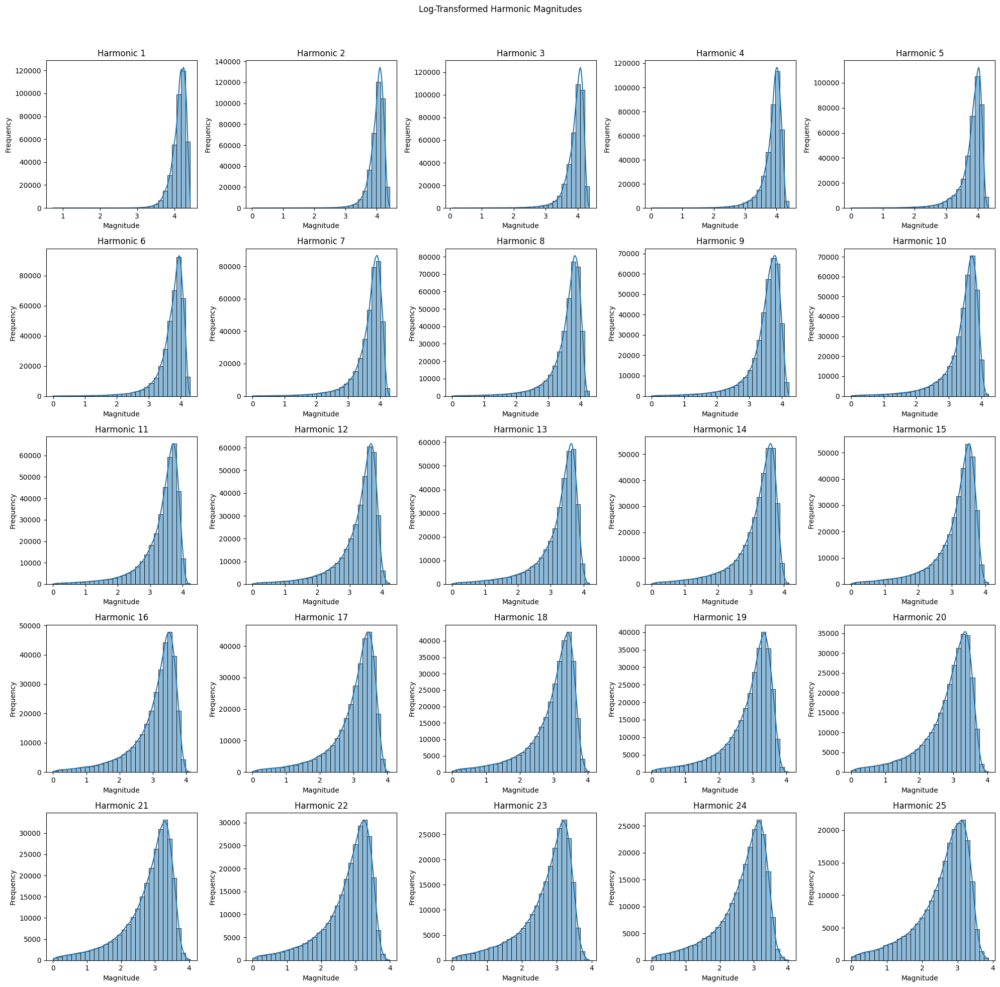

Harmonic 1 Skewness: -1.6048
Harmonic 2 Skewness: -2.7828
Harmonic 3 Skewness: -2.9382
Harmonic 4 Skewness: -2.7929
Harmonic 5 Skewness: -2.8036
Harmonic 6 Skewness: -2.6288
Harmonic 7 Skewness: -2.5539
Harmonic 8 Skewness: -2.4398
Harmonic 9 Skewness: -2.3115
Harmonic 10 Skewness: -2.2072
Harmonic 11 Skewness: -2.0299
Harmonic 12 Skewness: -1.9013
Harmonic 13 Skewness: -1.8568
Harmonic 14 Skewness: -1.7798
Harmonic 15 Skewness: -1.7920
Harmonic 16 Skewness: -1.6408
Harmonic 17 Skewness: -1.6234
Harmonic 18 Skewness: -1.5592
Harmonic 19 Skewness: -1.4976
Harmonic 20 Skewness: -1.4126
Harmonic 21 Skewness: -1.3465
Harmonic 22 Skewness: -1.3348
Harmonic 23 Skewness: -1.2800
Harmonic 24 Skewness: -1.2198
Harmonic 25 Skewness: -1.1470
Average Skewness for Log-Transformed Harmonic Magnitudes: -1.9394


In [47]:
hmag_log_transformed = np.log(hmag_filtered - np.nanmin(hmag_filtered) + 1)
plot_histograms_with_kde(hmag_log_transformed, 'Log-Transformed Harmonic Magnitudes')
calculate_skewness(hmag_log_transformed, 'Log-Transformed Harmonic Magnitudes')

#### e. Square Root Transformation
- Less aggressive than log transformation but still effective for reducing skewness.
- Formula: $Y^{\prime}=\sqrt{Y-\min (Y)+1}$
- Note: Ensure all values are non-negative.

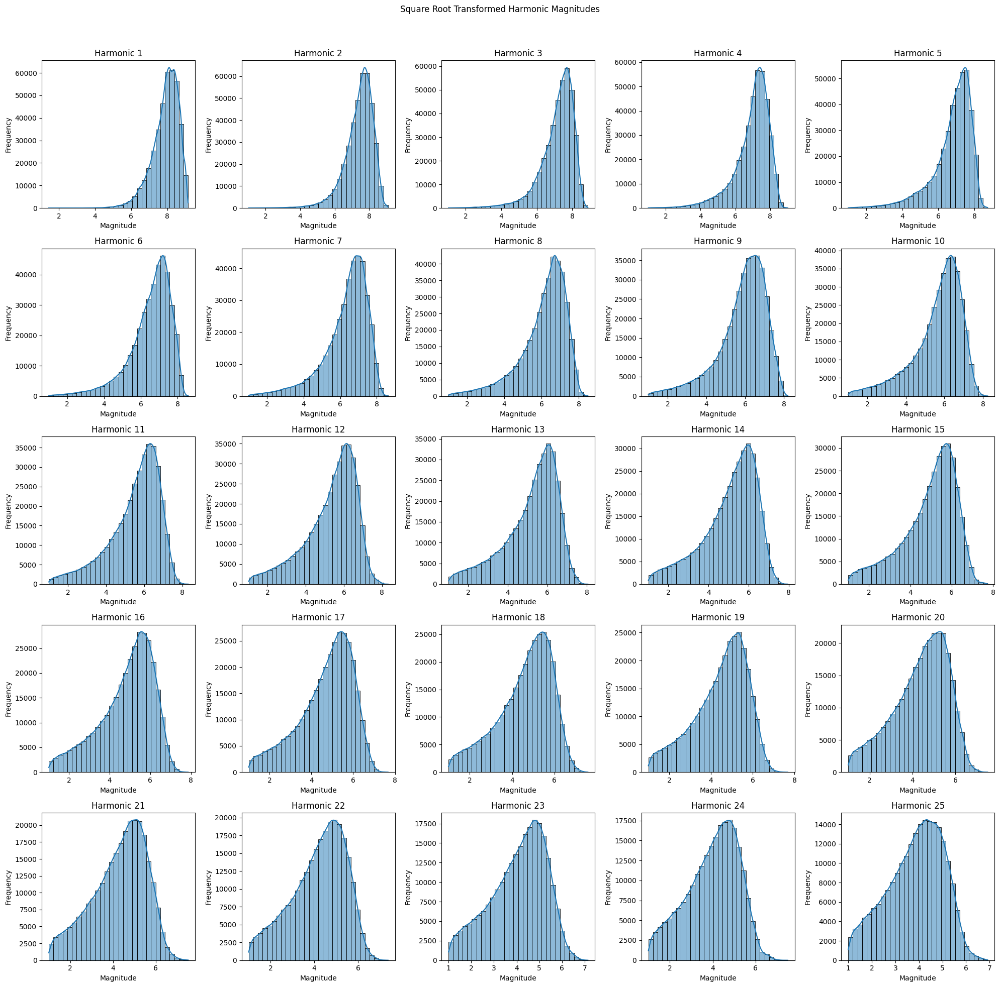

Harmonic 1 Skewness: -1.0817
Harmonic 2 Skewness: -1.4265
Harmonic 3 Skewness: -1.5860
Harmonic 4 Skewness: -1.4918
Harmonic 5 Skewness: -1.5435
Harmonic 6 Skewness: -1.3508
Harmonic 7 Skewness: -1.3247
Harmonic 8 Skewness: -1.2590
Harmonic 9 Skewness: -1.1517
Harmonic 10 Skewness: -1.1421
Harmonic 11 Skewness: -1.0212
Harmonic 12 Skewness: -0.9383
Harmonic 13 Skewness: -0.9382
Harmonic 14 Skewness: -0.8704
Harmonic 15 Skewness: -0.8875
Harmonic 16 Skewness: -0.7693
Harmonic 17 Skewness: -0.7500
Harmonic 18 Skewness: -0.7042
Harmonic 19 Skewness: -0.6545
Harmonic 20 Skewness: -0.5785
Harmonic 21 Skewness: -0.5204
Harmonic 22 Skewness: -0.5281
Harmonic 23 Skewness: -0.4982
Harmonic 24 Skewness: -0.4281
Harmonic 25 Skewness: -0.3733
Average Skewness for Square Root Transformed Harmonic Magnitudes: -0.9527


In [48]:
hmag_sqrt_transformed = np.sqrt(hmag_filtered - np.nanmin(hmag_filtered) + 1)
plot_histograms_with_kde(hmag_sqrt_transformed, 'Square Root Transformed Harmonic Magnitudes')
calculate_skewness(hmag_sqrt_transformed, 'Square Root Transformed Harmonic Magnitudes')

#### f. Reflect and Log Transformation
- Useful for handling left-skewed data.
- Formula: $Y^{\prime}=\log (K-Y)$
- Note: Reflects the data around a constant K before applying the log transformation.

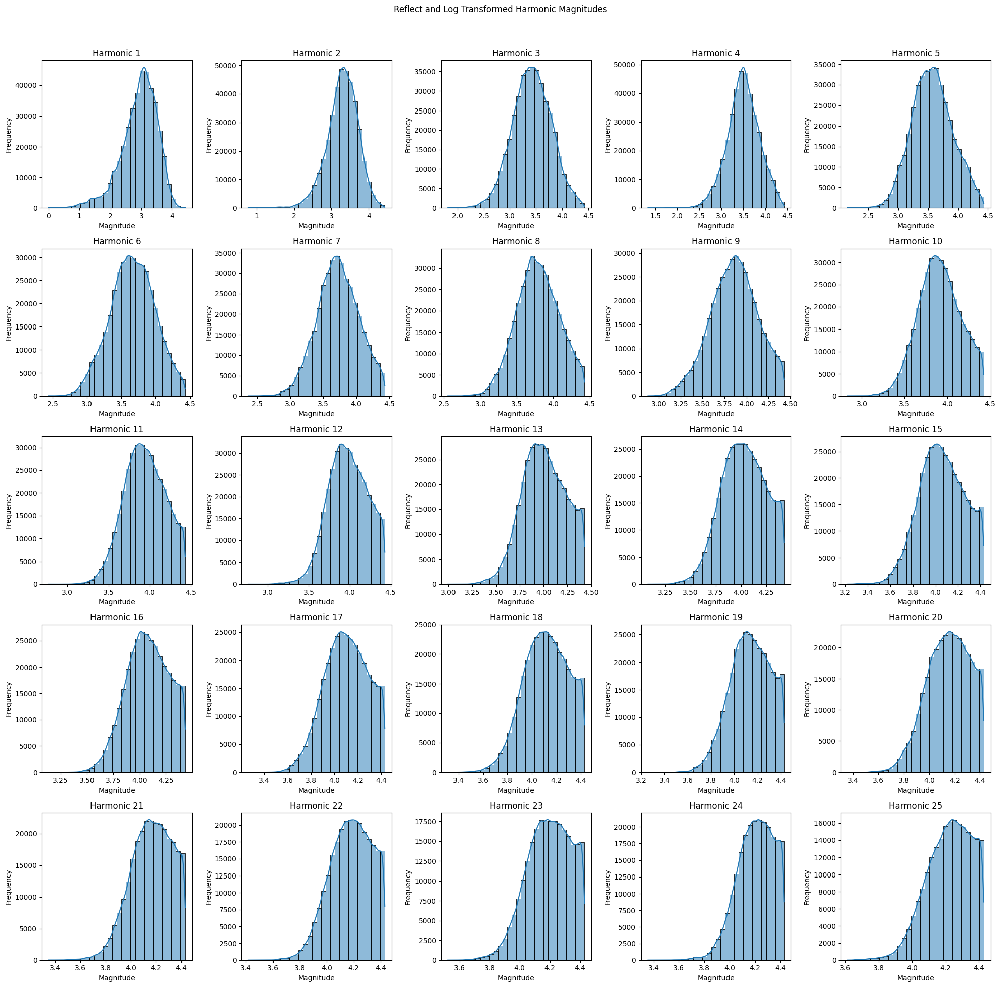

Harmonic 1 Skewness: -0.8074
Harmonic 2 Skewness: -0.5423
Harmonic 3 Skewness: -0.0944
Harmonic 4 Skewness: -0.1499
Harmonic 5 Skewness: 0.0780
Harmonic 6 Skewness: -0.0804
Harmonic 7 Skewness: -0.0812
Harmonic 8 Skewness: -0.0579
Harmonic 9 Skewness: -0.1540
Harmonic 10 Skewness: -0.0451
Harmonic 11 Skewness: -0.1020
Harmonic 12 Skewness: -0.1783
Harmonic 13 Skewness: -0.1140
Harmonic 14 Skewness: -0.1542
Harmonic 15 Skewness: -0.1285
Harmonic 16 Skewness: -0.2135
Harmonic 17 Skewness: -0.2109
Harmonic 18 Skewness: -0.2595
Harmonic 19 Skewness: -0.2906
Harmonic 20 Skewness: -0.3478
Harmonic 21 Skewness: -0.4446
Harmonic 22 Skewness: -0.3750
Harmonic 23 Skewness: -0.3955
Harmonic 24 Skewness: -0.5109
Harmonic 25 Skewness: -0.5280
Average Skewness for Reflect and Log Transformed Harmonic Magnitudes: -0.2475


In [67]:
K = np.nanmax(hmag_filtered) + 1
hmag_reflect_log_transformed = np.full_like(hmag_filtered, np.nan)
# np.zeros_like(hmag_filtered)
for i in range(hmag_filtered.shape[1]):
    hmag_reflect_log_transformed[~np.isnan(hmag_filtered[:, i]), i] = np.log(K - hmag_filtered[~np.isnan(hmag_filtered[:, i]), i])
plot_histograms_with_kde(hmag_reflect_log_transformed, 'Reflect and Log Transformed Harmonic Magnitudes')
calculate_skewness(hmag_reflect_log_transformed, 'Reflect and Log Transformed Harmonic Magnitudes')

#### g. Reflect and Square Root Transformation
- Similar to Reflect and Log Transformation but uses the square root instead.
- Formula: $Y^{\prime}=\sqrt{K-Y}$
- Note: Reflects the data around a constant K before applying the square root transformation.

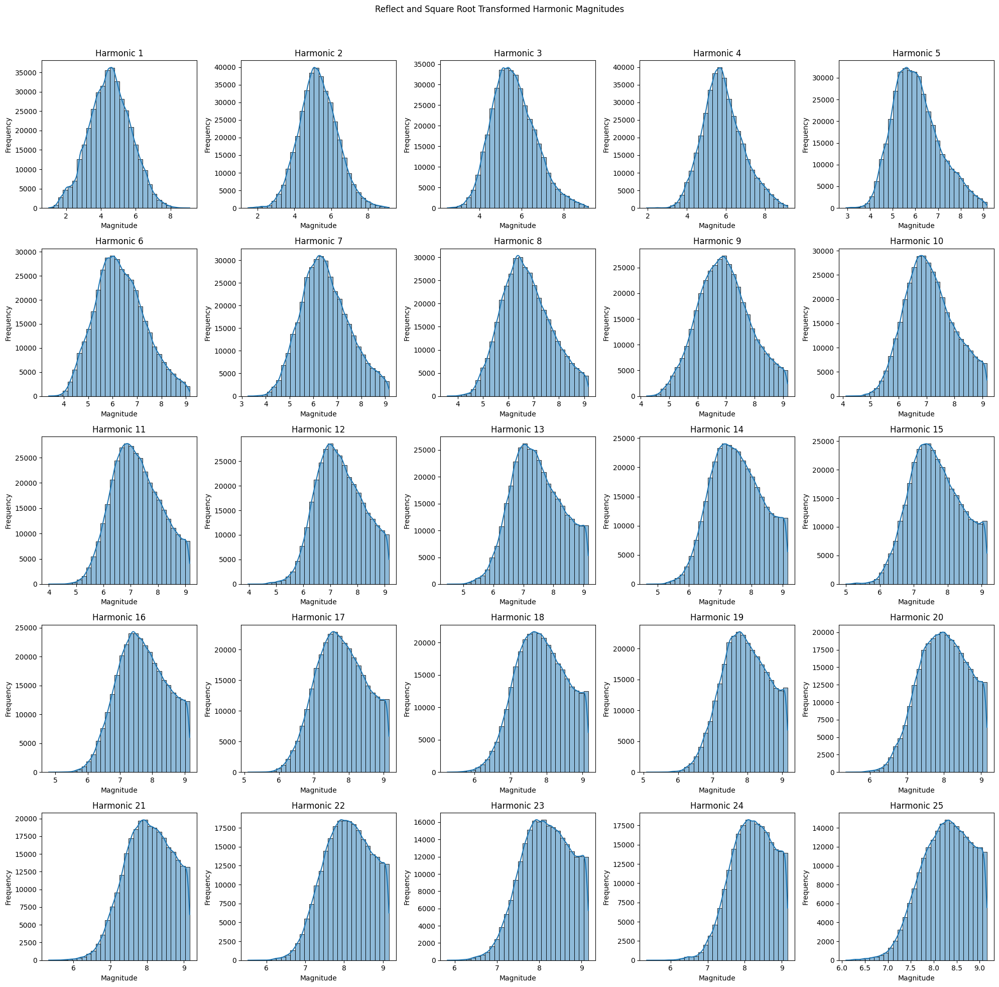

Harmonic 1 Skewness: 0.0407
Harmonic 2 Skewness: 0.1819
Harmonic 3 Skewness: 0.4212
Harmonic 4 Skewness: 0.3714
Harmonic 5 Skewness: 0.5019
Harmonic 6 Skewness: 0.3092
Harmonic 7 Skewness: 0.3008
Harmonic 8 Skewness: 0.2833
Harmonic 9 Skewness: 0.1698
Harmonic 10 Skewness: 0.2385
Harmonic 11 Skewness: 0.1614
Harmonic 12 Skewness: 0.0900
Harmonic 13 Skewness: 0.1220
Harmonic 14 Skewness: 0.0669
Harmonic 15 Skewness: 0.0841
Harmonic 16 Skewness: -0.0105
Harmonic 17 Skewness: -0.0237
Harmonic 18 Skewness: -0.0700
Harmonic 19 Skewness: -0.1116
Harmonic 20 Skewness: -0.1756
Harmonic 21 Skewness: -0.2569
Harmonic 22 Skewness: -0.2145
Harmonic 23 Skewness: -0.2397
Harmonic 24 Skewness: -0.3411
Harmonic 25 Skewness: -0.3749
Average Skewness for Reflect and Square Root Transformed Harmonic Magnitudes: 0.0610


In [87]:
hmag_reflect_sqrt_transformed = np.full_like(hmag_filtered, np.nan)
# np.zeros_like(hmag_filtered)
for i in range(hmag_filtered.shape[1]):
    hmag_reflect_sqrt_transformed[~np.isnan(hmag_filtered[:, i]), i] = np.sqrt(K - hmag_filtered[~np.isnan(hmag_filtered[:, i]), i])
plot_histograms_with_kde(hmag_reflect_sqrt_transformed, 'Reflect and Square Root Transformed Harmonic Magnitudes')
calculate_skewness(hmag_reflect_sqrt_transformed, 'Reflect and Square Root Transformed Harmonic Magnitudes')

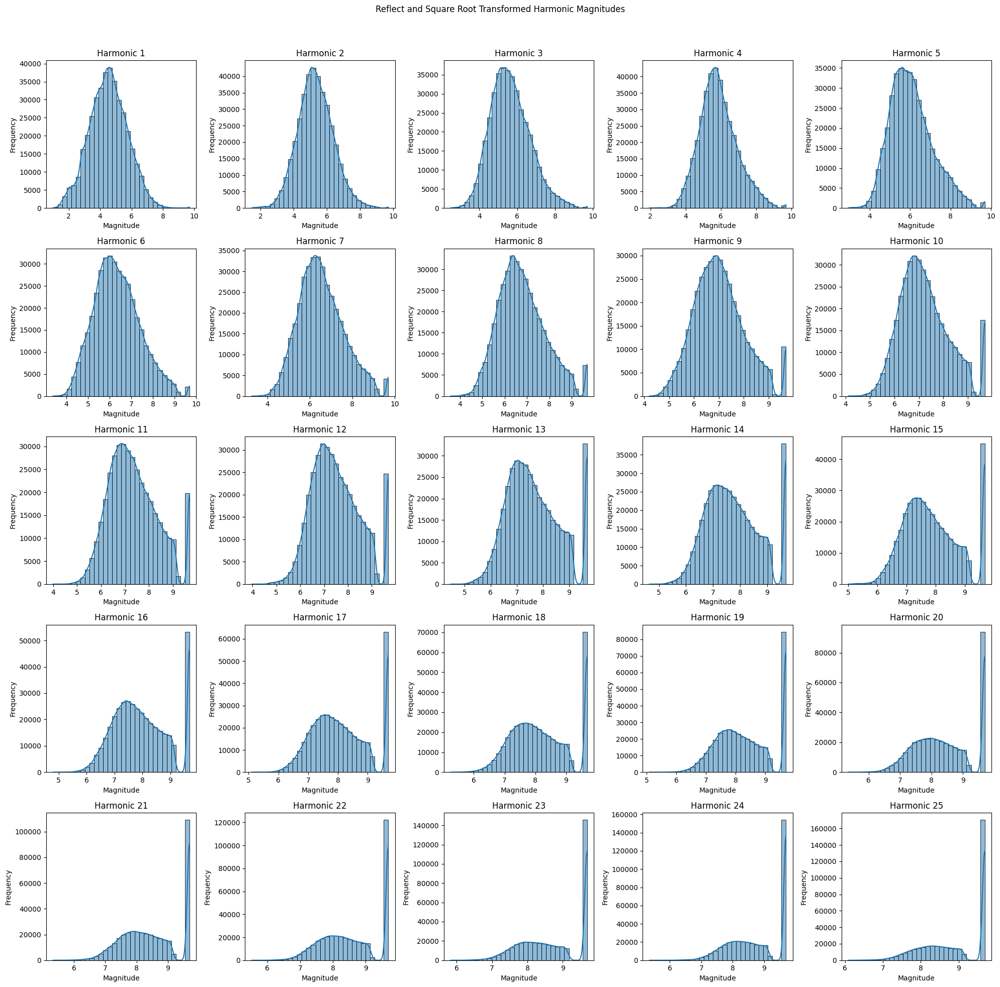

Harmonic 1 Skewness: 0.0676
Harmonic 2 Skewness: 0.2088
Harmonic 3 Skewness: 0.4519
Harmonic 4 Skewness: 0.4321
Harmonic 5 Skewness: 0.5826
Harmonic 6 Skewness: 0.4115
Harmonic 7 Skewness: 0.4547
Harmonic 8 Skewness: 0.4948
Harmonic 9 Skewness: 0.4421
Harmonic 10 Skewness: 0.5438
Harmonic 11 Skewness: 0.4531
Harmonic 12 Skewness: 0.3956
Harmonic 13 Skewness: 0.4195
Harmonic 14 Skewness: 0.3732
Harmonic 15 Skewness: 0.4057
Harmonic 16 Skewness: 0.2913
Harmonic 17 Skewness: 0.2739
Harmonic 18 Skewness: 0.2151
Harmonic 19 Skewness: 0.1310
Harmonic 20 Skewness: 0.0500
Harmonic 21 Skewness: -0.0655
Harmonic 22 Skewness: -0.1119
Harmonic 23 Skewness: -0.2593
Harmonic 24 Skewness: -0.3455
Harmonic 25 Skewness: -0.4547
Average Skewness for Reflect and Square Root Transformed Harmonic Magnitudes: 0.2345


In [69]:
# Reflect and Square Root Transformation
K = np.max(hmag_combined) + 1
hmag_reflect_sqrt_transformed = np.sqrt(K - hmag_combined)

# Plot Reflect and Square Root Transformed data
plot_histograms_with_kde(hmag_reflect_sqrt_transformed, 'Reflect and Square Root Transformed Harmonic Magnitudes')

# Calculate skewness for Reflect and Square Root Transformed data
calculate_skewness(hmag_reflect_sqrt_transformed, 'Reflect and Square Root Transformed Harmonic Magnitudes')

Log Transformation Skewness: -1.9394
Square Root Transformation Skewness: -0.9527
Box-Cox Transformation Skewness: -0.0820
Reflect and Log Transformation Skewness: -2.0990
Reflect and Square Root Transformation Skewness: -1.2286
Exponential Transformation Skewness: 3.3773
Square Transformation Skewness: 0.5032
Two best transformations: ['Reflect and Log', 'Log']


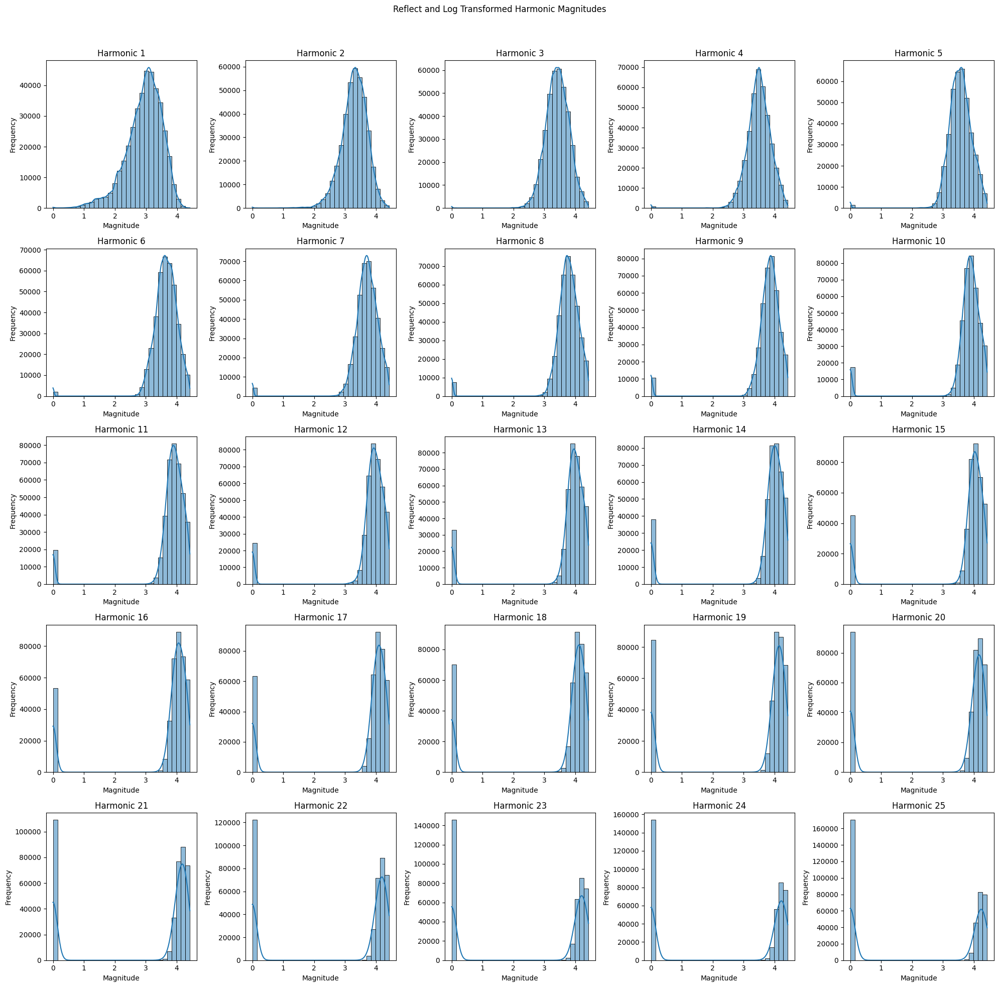

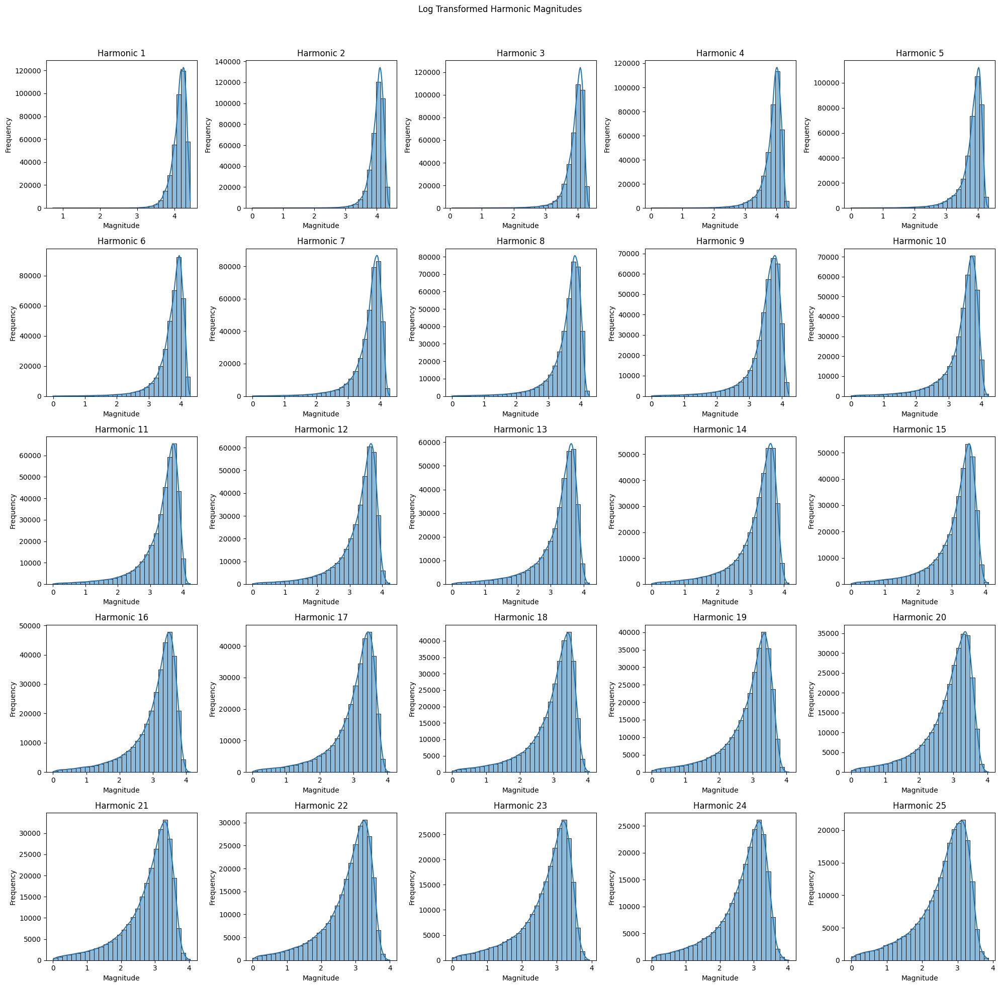

### 4.3.3. 3 Scaled hmag Distribution

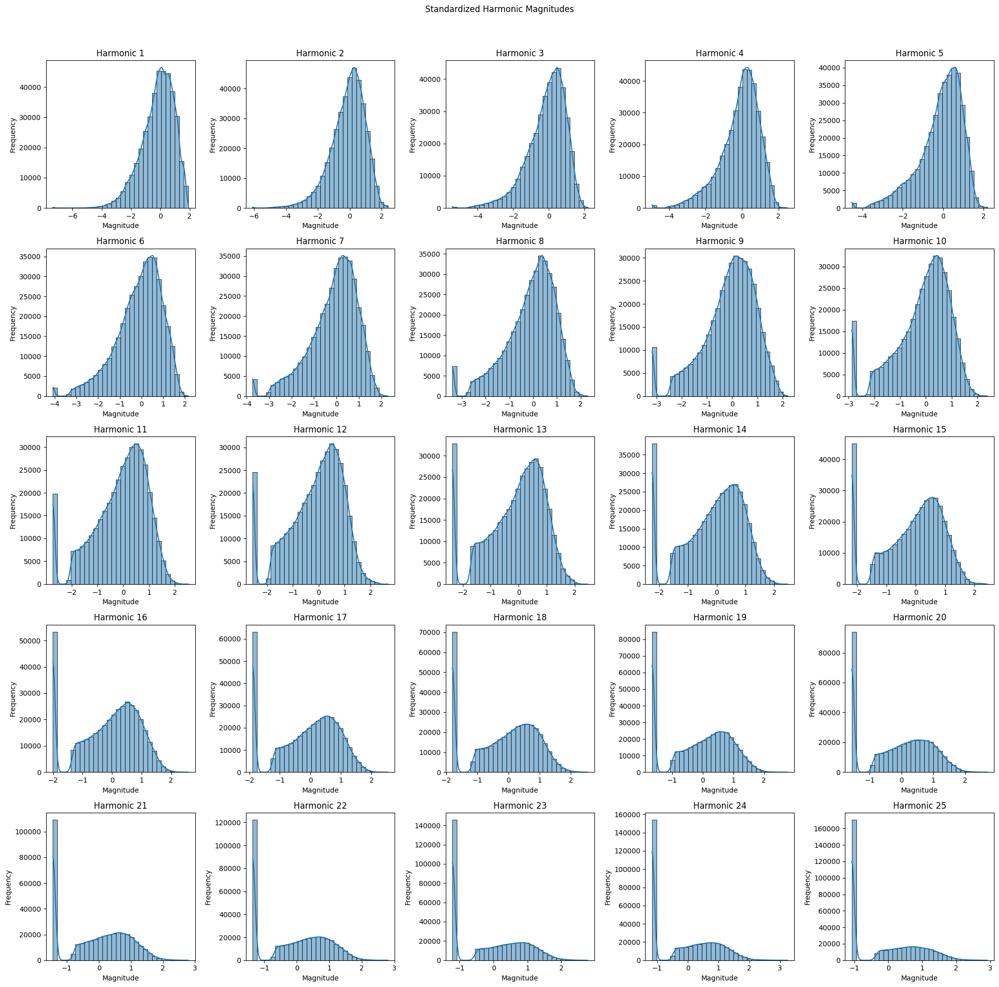

In [20]:
# Plot histograms with KDE for each scaling method
plot_histograms_with_kde(hmag_standardized, 'Standardized Harmonic Magnitudes')

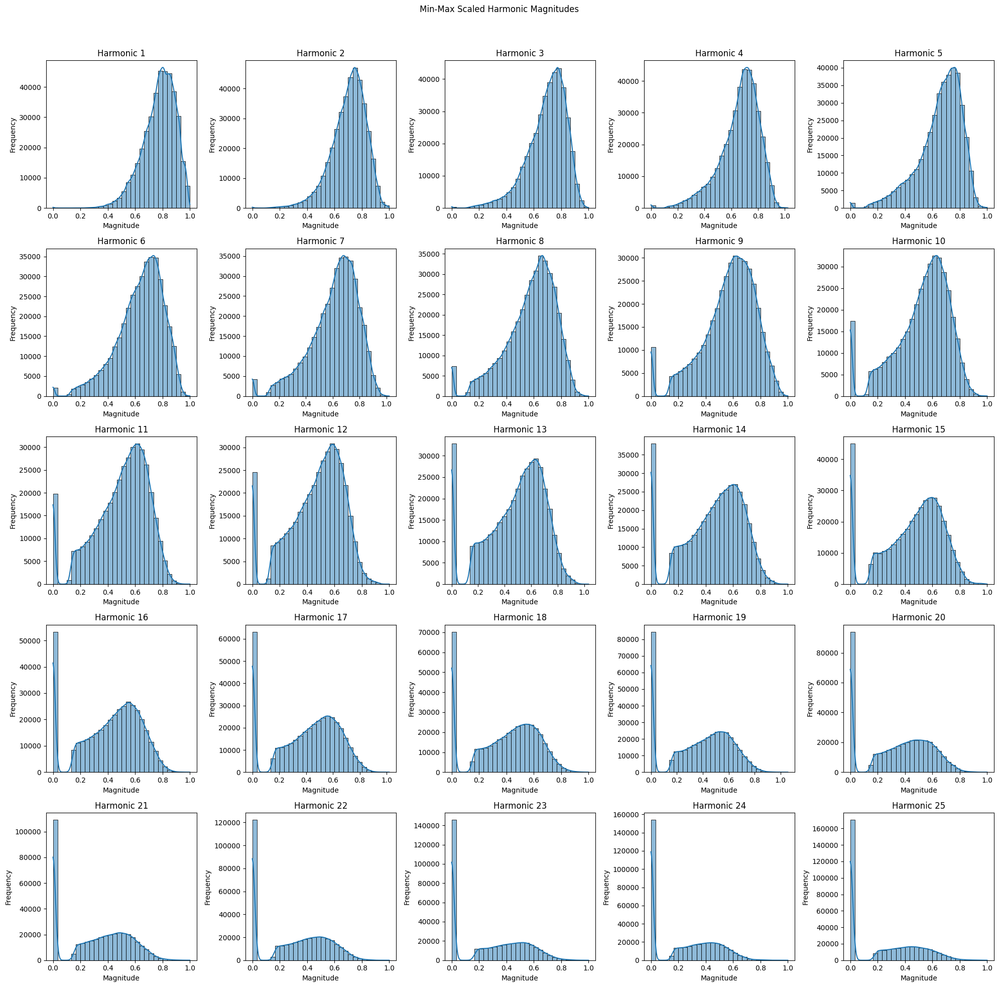

In [15]:
plot_histograms_with_kde(hmag_minmax, 'Min-Max Scaled Harmonic Magnitudes')

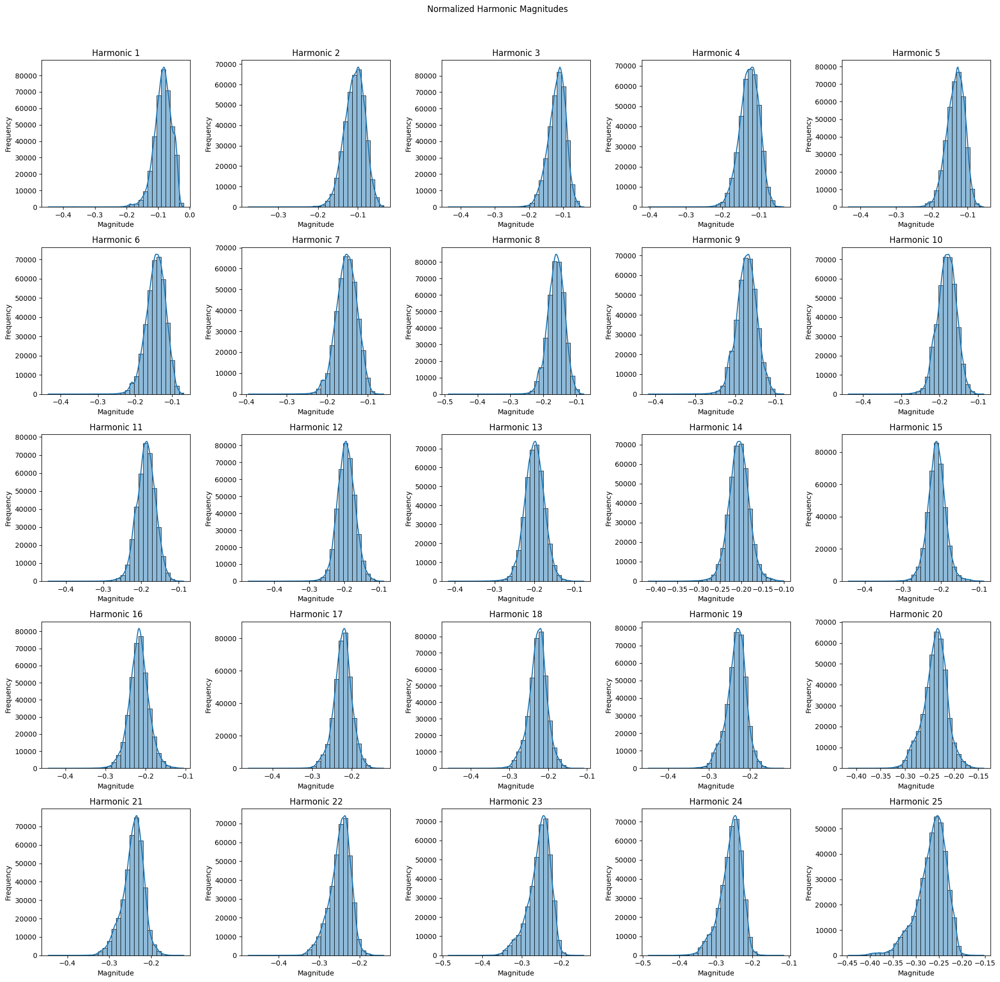

In [16]:
plot_histograms_with_kde(hmag_normalized, 'Normalized Harmonic Magnitudes')

In [ ]:

# Perform KMeans clustering
kmeans = KMeans(n_clusters=10, random_state=42)  # Example with 10 clusters
clusters = kmeans.fit_predict(hmag_log_standardized)

# Evaluate clustering with silhouette score
silhouette_avg = silhouette_score(hmag_log_standardized, clusters)
print(f'Silhouette Score: {silhouette_avg}')

# 5. KMeans Clustering
- g. Reflect and Square Root Transformation is selected due to the lowest Skewness Value
- Perform KMeans on the Transformed Data with Clipped Values Maintained: Given the requirement for downstream synthesis, use the transformed data while maintaining -100 values.

## 5.0. Load hmag_combied and Define Functions

In [4]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define function to plot histograms with KDE for each harmonic magnitude
def plot_histograms_with_kde(hmag_data, title):
    plt.figure(figsize=(20, 20))
    for i in range(25):
        plt.subplot(5, 5, i+1)
        #filtered_data = hmag_data[hmag_data[:, i] != -100, i]  # Filter out values equal to -100
        #filtered_data = hmag_data
        filtered_data = hmag_data[~np.isnan(hmag_data[:, i]), i]  # Filter out NaN values
        sns.histplot(filtered_data, kde=True, bins=30)
        plt.title(f'Harmonic {i+1}')
        plt.xlabel('Magnitude')
        plt.ylabel('Frequency')
    plt.suptitle(title)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# Define function to calculate and print skewness
def calculate_skewness(hmag_data, title):
    skewness_values = []
    for i in range(25):
        #filtered_data = hmag_data[hmag_data[:, i] != -100, i]  # Filter out values equal to -100
        filtered_data = hmag_data[~np.isnan(hmag_data[:, i]), i]  # Filter out NaN values
        skewness = stats.skew(filtered_data, nan_policy='omit')
        skewness_values.append(skewness)
        print(f'Harmonic {i+1} Skewness: {skewness:.4f}')
    avg_skewness = np.mean(skewness_values)
    print(f'Average Skewness for {title}: {avg_skewness:.4f}')

In [5]:
import os
import numpy as np
from scipy import stats
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Load npz files and combine data
npz_dir = '../ViolinEtudes-zenodo-test/anal/with_timestamps/train_set'
hmag_list = []

for file in os.listdir(npz_dir):
    if file.endswith('.npz'):
        file_path = os.path.join(npz_dir, file)
        data = np.load(file_path)
        hmag = data['hmag']
        hmag_list.append(hmag)

# Combine all data
hmag_combined = np.vstack(hmag_list).astype(np.float64)

## 5.1. Optimal Reflect and Square Root Transoformation and Standardization

In [6]:
# Reflect and Square Root Transformation
K = np.max(hmag_combined) + 1
hmag_reflect_sqrt_transformed = np.sqrt(K - hmag_combined)

### a. Maintaining -100

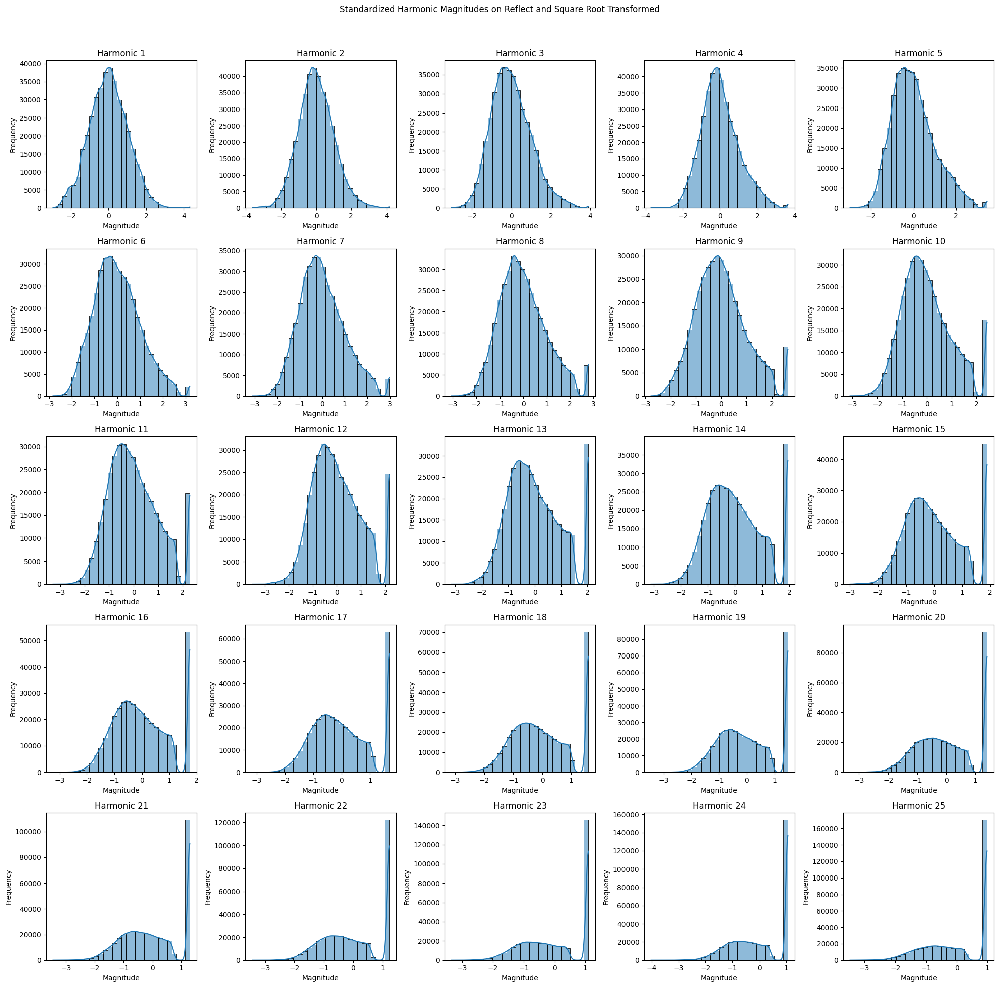

Harmonic 1 Skewness: 0.0676
Harmonic 2 Skewness: 0.2088
Harmonic 3 Skewness: 0.4519
Harmonic 4 Skewness: 0.4321
Harmonic 5 Skewness: 0.5826
Harmonic 6 Skewness: 0.4115
Harmonic 7 Skewness: 0.4547
Harmonic 8 Skewness: 0.4948
Harmonic 9 Skewness: 0.4421
Harmonic 10 Skewness: 0.5438
Harmonic 11 Skewness: 0.4531
Harmonic 12 Skewness: 0.3956
Harmonic 13 Skewness: 0.4195
Harmonic 14 Skewness: 0.3732
Harmonic 15 Skewness: 0.4057
Harmonic 16 Skewness: 0.2913
Harmonic 17 Skewness: 0.2739
Harmonic 18 Skewness: 0.2151
Harmonic 19 Skewness: 0.1310
Harmonic 20 Skewness: 0.0500
Harmonic 21 Skewness: -0.0655
Harmonic 22 Skewness: -0.1119
Harmonic 23 Skewness: -0.2593
Harmonic 24 Skewness: -0.3455
Harmonic 25 Skewness: -0.4547
Average Skewness for Std on Reflect and Square Root Transformed Harmonic Magnitudes: 0.2345


In [115]:
# Apply StandardScaler
scaler = StandardScaler()
hmag_std_transformed = scaler.fit_transform(hmag_reflect_sqrt_transformed)

# Plot histograms with KDE for each scaling method
plot_histograms_with_kde(hmag_std_transformed, 'Standardized Harmonic Magnitudes on Reflect and Square Root Transformed')
calculate_skewness(hmag_std_transformed, 'Std on Reflect and Square Root Transformed Harmonic Magnitudes')

In [98]:
hmag_filtered.shape, hmag_reflect_sqrt_transformed_filtered.shape

((388830, 25), (388830, 25))

In [100]:
np.min(hmag_filtered), np.min(hmag_reflect_sqrt_transformed_filtered), np.min(hmag_std_transformed_filtered)

(nan, nan, nan)

In [116]:
hmag_std_transformed.shape, np.min(hmag_std_transformed), np.max(hmag_std_transformed)

((388830, 25), -4.028416062738705, 4.321429408524204)

In [143]:
# Save standardization statistics
standardization_stats = {
    'mean': scaler.mean_,
    'scale': scaler.scale_
}

standardization_stats_df = pd.DataFrame(standardization_stats)
standardization_stats_df.to_csv('./timbre_cluster_transform_std/transform_standardization_stats.csv', index=False)

### b. Filtering out -100

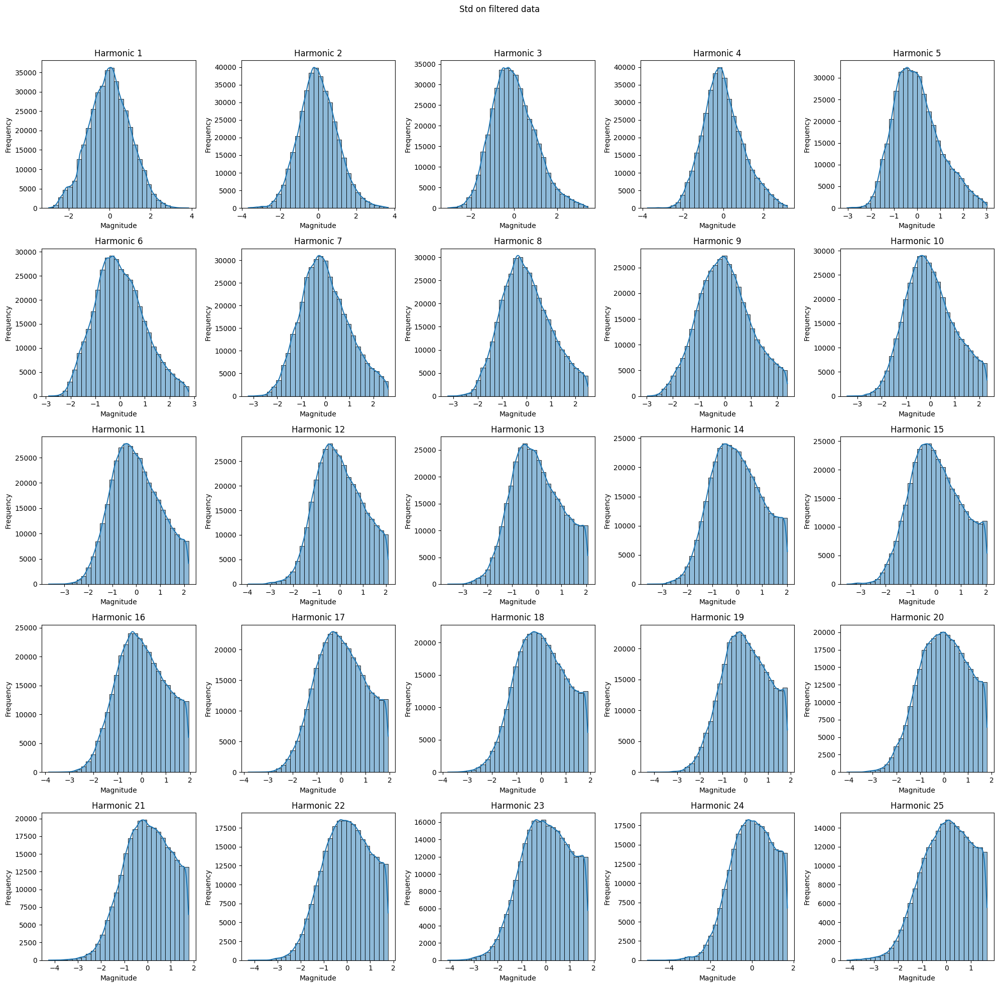

Harmonic 1 Skewness: 0.0407
Harmonic 2 Skewness: 0.1819
Harmonic 3 Skewness: 0.4212
Harmonic 4 Skewness: 0.3714
Harmonic 5 Skewness: 0.5019
Harmonic 6 Skewness: 0.3092
Harmonic 7 Skewness: 0.3008
Harmonic 8 Skewness: 0.2833
Harmonic 9 Skewness: 0.1698
Harmonic 10 Skewness: 0.2385
Harmonic 11 Skewness: 0.1614
Harmonic 12 Skewness: 0.0900
Harmonic 13 Skewness: 0.1220
Harmonic 14 Skewness: 0.0669
Harmonic 15 Skewness: 0.0841
Harmonic 16 Skewness: -0.0105
Harmonic 17 Skewness: -0.0237
Harmonic 18 Skewness: -0.0700
Harmonic 19 Skewness: -0.1116
Harmonic 20 Skewness: -0.1756
Harmonic 21 Skewness: -0.2569
Harmonic 22 Skewness: -0.2145
Harmonic 23 Skewness: -0.2397
Harmonic 24 Skewness: -0.3411
Harmonic 25 Skewness: -0.3749
Average Skewness for Std on filtered data: 0.0610


In [120]:
hmag_reflect_sqrt_transformed_filtered = np.full_like(hmag_filtered, np.nan)
# np.zeros_like(hmag_filtered)
for i in range(hmag_filtered.shape[1]):
    hmag_reflect_sqrt_transformed_filtered[~np.isnan(hmag_filtered[:, i]), i] = np.sqrt(K - hmag_filtered[~np.isnan(hmag_filtered[:, i]), i])

# Apply StandardScaler to filtered data
scaler = StandardScaler()
hmag_std_transformed_filtered = scaler.fit_transform(hmag_reflect_sqrt_transformed_filtered) # scaler.fit_transform
# Plot histograms with KDE for each scaling method
plot_histograms_with_kde(hmag_std_transformed_filtered, 'Std on filtered data')
calculate_skewness(hmag_std_transformed_filtered, 'Std on filtered data')

### c. Inversion Function

In [127]:
# Inverse function to transform hmag_scaled back to hmag_reflect_sqrt_transformed and then to hmag_combined
def inverse_transform(hmag_std_transformed, K, mean, scale):
    # Inverse StandardScaler
    hmag_reflect_sqrt_transformed = hmag_std_transformed * scale + mean
    
    # Inverse Reflect and Square Root Transformation
    hmag_origin = K - (hmag_reflect_sqrt_transformed ** 2)

    # Correct any values that should be -100
    hmag_origin = np.where(hmag_combined == -100, -100, hmag_origin)
    
    return hmag_origin

# Example usage of inverse function
hmag_inverse_transformed = inverse_transform(hmag_std_transformed, K, scaler.mean_, scaler.scale_)
np.allclose(hmag_combined, hmag_inverse_transformed)

False

## 5.2. KMeans Clustering Analysis

### a. Find the Optimal K

In [9]:
import os
import numpy as np
import pandas as pd
from scipy import stats
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
from sklearn.metrics import silhouette_score
from tqdm import tqdm

# Determine the optimal number of clusters using the Elbow Method and Silhouette Score
inertia = []
silhouette_scores = []
k_range = range(10, 120, 10)

for k in tqdm(k_range):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(hmag_std_transformed)
    inertia.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(hmag_std_transformed, kmeans.labels_))

100%|███████████████████████████████████████| 11/11 [5:08:39<00:00, 1683.61s/it]


In [14]:
inertia, silhouette_scores

([2869264.906280495,
  2503872.0188590093,
  2334381.1272772443,
  2216309.8001019405,
  2136419.3292896766,
  2074219.1906061175,
  2024683.9731799755,
  1978625.1196938113,
  1937597.717262494,
  1906521.0446248522,
  1879750.2531386227],
 [0.10521572399984505,
  0.09165853930342988,
  0.07942940694661392,
  0.07904245112861084,
  0.07453547477421194,
  0.07124957357155252,
  0.07110836245587468,
  0.07103915491857983,
  0.07136463660181096,
  0.07125244388058757,
  0.06892723083432802])

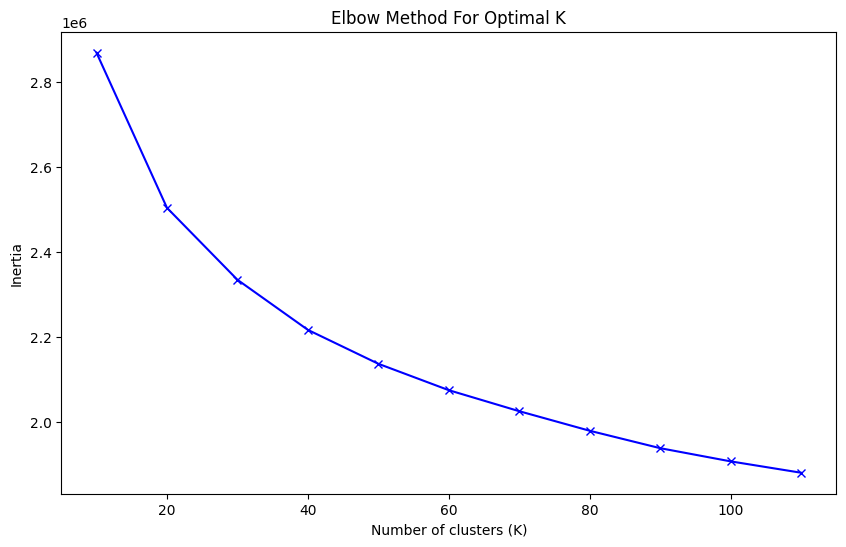

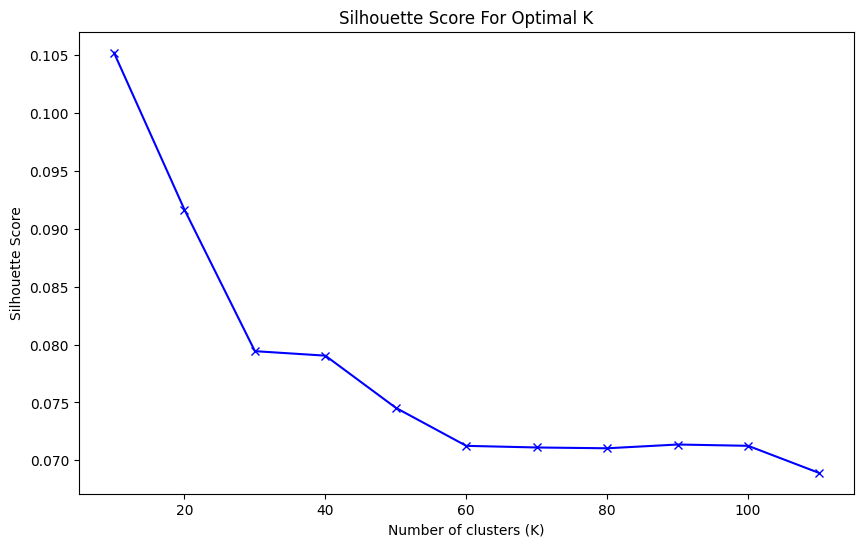

In [10]:
# Plot the Elbow Method graph
plt.figure(figsize=(10, 6))
plt.plot(k_range, inertia, 'bx-')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal K')
plt.show()

# Plot Silhouette Scores
plt.figure(figsize=(10, 6))
plt.plot(k_range, silhouette_scores, 'bx-')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score For Optimal K')
plt.show()

100%|███████████████████████████████████████████| 11/11 [06:07<00:00, 33.37s/it]


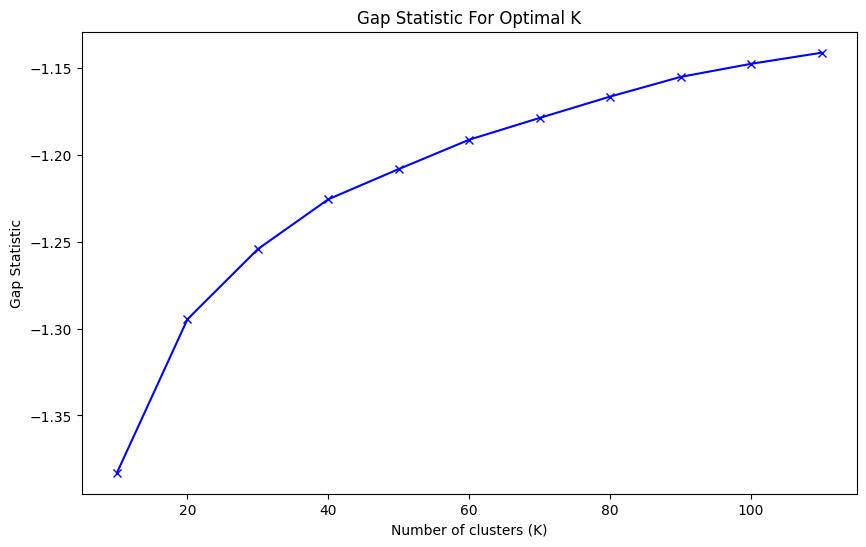

Optimal number of clusters based on Gap Statistic (K): 110


In [19]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin_min
from tqdm import tqdm

def gap_statistic(data, k_range, n_refs=5):
    gaps = np.zeros(len(k_range))
    for i, k in tqdm(enumerate(k_range), total=len(k_range)):
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(data)
        _, distances = pairwise_distances_argmin_min(data, kmeans.cluster_centers_)
        Wk = np.sum(distances ** 2)

        ref_disps = np.zeros(n_refs)
        for j in range(n_refs):
            random_ref = np.random.random_sample(size=data.shape)
            kmeans.fit(random_ref)
            _, ref_distances = pairwise_distances_argmin_min(random_ref, kmeans.cluster_centers_)
            ref_disp = np.sum(ref_distances ** 2)
            ref_disps[j] = ref_disp

        gaps[i] = np.log(np.mean(ref_disps)) - np.log(Wk)
    
    return gaps

# Define the range of clusters to test
k_range = range(10, 120, 10)

# Calculate the gap statistic
gaps = gap_statistic(hmag_std_transformed, k_range)

# Plot gap statistic
plt.figure(figsize=(10, 6))
plt.plot(k_range, gaps, 'bx-')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Gap Statistic')
plt.title('Gap Statistic For Optimal K')
plt.show()

# Determine the optimal K based on the Gap Statistic
optimal_k_gap = k_range[np.argmax(gaps)]
print(f'Optimal number of clusters based on Gap Statistic (K): {optimal_k_gap}')


In [22]:
gaps

array([-1.38291366, -1.29463522, -1.25425858, -1.22561641, -1.20824304,
       -1.19136222, -1.17883393, -1.16656106, -1.155248  , -1.14771679,
       -1.14134426])

In [12]:
# Choose the optimal K based on the Elbow Method and Silhouette Score
optimal_k = k_range[silhouette_scores.index(max(silhouette_scores))]
print(f'Optimal number of clusters (K): {optimal_k}')

Optimal number of clusters (K): 10


In [ ]:
# Fit the final KMeans model with the optimal number of clusters
optimal_k = 80
kmeans_optimal = KMeans(n_clusters=optimal_k, random_state=0)
kmeans_optimal.fit(hmag_std_transformed)

# Get cluster labels
labels_optimal = kmeans_optimal.labels_

# Plot the cluster centroids
centroids_optimal = kmeans_optimal.cluster_centers_

plt.figure(figsize=(10, 6))
for i in range(optimal_k):
    plt.plot(centroids_optimal[i], label=f'Cluster {i+1}')
plt.title('Cluster Centroids (Optimal K)')
plt.xlabel('Harmonic Index')
plt.ylabel('Scaled Transformed Magnitude')
plt.legend()
plt.show()

In [71]:
labels_optimal

array([74, 12, 12, ..., 31, 31, 31], dtype=int32)

### b. Data Analysis

#### b.1. PCA or t-SNE Distribution

In [128]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import os
import numpy as np
import pandas as pd
from scipy import stats
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
from sklearn.metrics import silhouette_score
from tqdm import tqdm
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Reduce dimensionality for visualization
pca = PCA(n_components=2)
hmag_pca = pca.fit_transform(hmag_std_transformed)

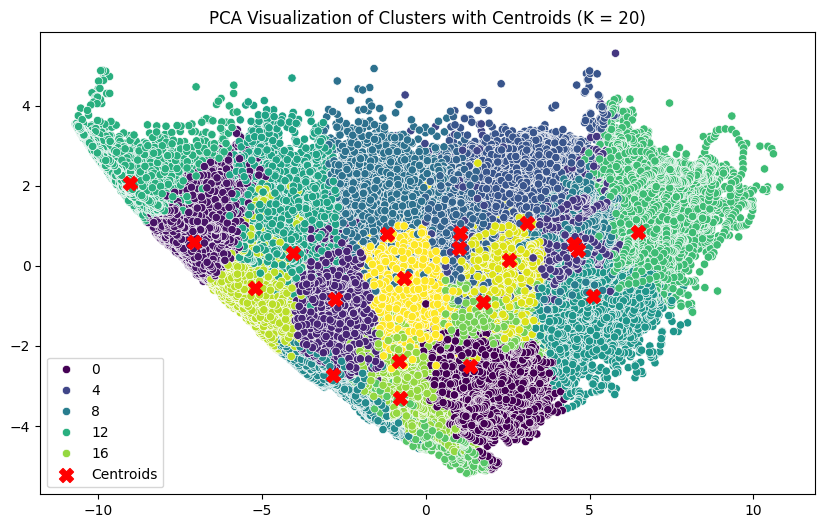

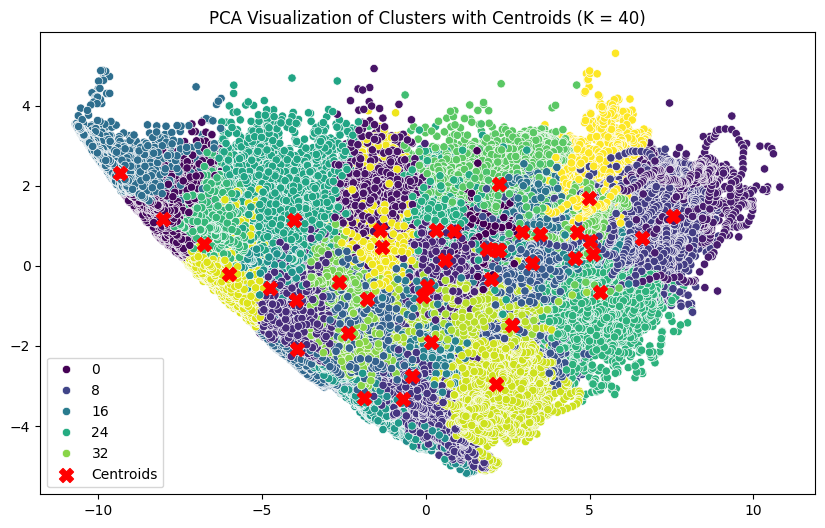

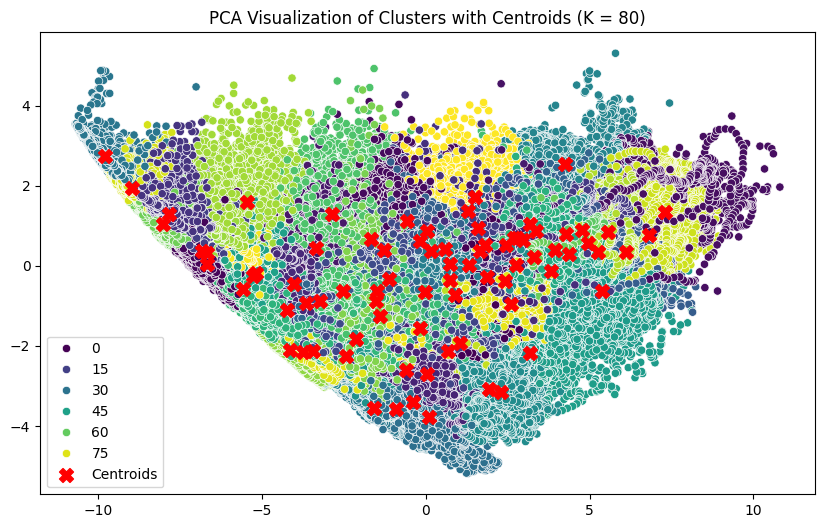

In [129]:
# Loop through the K values and plot
for k in k_values:
    # Perform KMeans clustering
    kmeans = KMeans(n_clusters=k, random_state=0)
    labels = kmeans.fit_predict(hmag_std_transformed)
    centroids = kmeans.cluster_centers_

    # Transform centroids into the same PCA space
    centroids_pca = pca.transform(centroids)

    # Plot PCA-transformed data with cluster labels
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=hmag_pca[:, 0], y=hmag_pca[:, 1], hue=labels, palette='viridis', legend='auto')
    plt.scatter(centroids_pca[:, 0], centroids_pca[:, 1], s=100, c='red', label='Centroids', marker='X')
    plt.title(f'PCA Visualization of Clusters with Centroids (K = {k})')
    plt.legend()
    plt.show()

In [ ]:
# Optional: Use t-SNE for non-linear dimensionality reduction
# tsne = TSNE(n_components=2)
# hmag_tsne = tsne.fit_transform(hmag_std_transformed)

# plt.figure(figsize=(10, 6))
# sns.scatterplot(x=hmag_tsne[:, 0], y=hmag_tsne[:, 1], hue=labels, palette='viridis')
# plt.title('t-SNE Visualization of Clusters')
# plt.show()

#### b.2. Histogram of Centoird Label Count

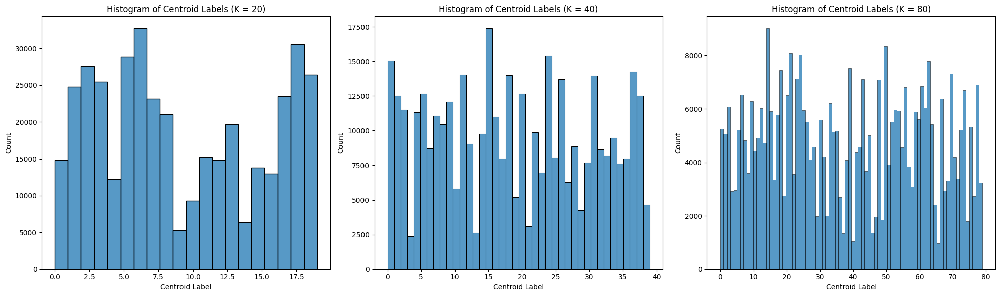

In [130]:
# Set the K values to iterate through
k_values = [20, 40, 80]

# Create a figure with subplots
plt.figure(figsize=(20, 6))

# Loop through the K values and plot
for i, k in enumerate(k_values, 1):
    # Perform KMeans clustering
    kmeans = KMeans(n_clusters=k, random_state=0)
    labels = kmeans.fit_predict(hmag_std_transformed)
    
    # Plot histogram of centroid label count
    plt.subplot(1, 3, i)
    sns.histplot(labels, bins=k, kde=False)
    plt.title(f'Histogram of Centroid Labels (K = {k})')
    plt.xlabel('Centroid Label')
    plt.ylabel('Count')

plt.tight_layout()
plt.show()

### c. Save the Scaler Statistics

In [83]:
os.makedirs('../ViolinEtudes-zenodo-test/timbre_cluster/statistics/timbre_cluster_transform_std', exist_ok=True)

In [56]:
import os
import numpy as np
from scipy import stats
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Load npz files and combine data
npz_dir = '../ViolinEtudes-zenodo-test/anal/with_timestamps/train_set'
hmag_list = []

for file in os.listdir(npz_dir):
    if file.endswith('.npz'):
        file_path = os.path.join(npz_dir, file)
        data = np.load(file_path)
        hmag = data['hmag']
        hmag_list.append(hmag)

# Combine all data
hmag_combined = np.vstack(hmag_list).astype(np.float64)

In [57]:
K

-6.097780998944933

In [131]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Reflect and Square Root Transformation
K = np.max(hmag_combined) + 1
hmag_reflect_sqrt_transformed = np.sqrt(K - hmag_combined)

# Apply StandardScaler
scaler = StandardScaler()
hmag_std_transformed = scaler.fit_transform(hmag_reflect_sqrt_transformed)

# Create a DataFrame for mean and scale
standardization_stats_df = pd.DataFrame({
    'mean': scaler.mean_,
    'scale': scaler.scale_
})

# Add the K value to the first row
standardization_stats_df.loc[0, 'K_value'] = K

# Save the DataFrame to a CSV file
standardization_stats_df.to_csv('../ViolinEtudes-zenodo-test/timbre_cluster/statistics/timbre_cluster_transform_std/transform_standardization_stats.csv', index=False)

print("Standardization statistics and K value saved to CSV file.")

Standardization statistics and K value saved to CSV file.


In [132]:
# Load the DataFrame
standardization_stats_df = pd.read_csv('../ViolinEtudes-zenodo-test/timbre_cluster/statistics/timbre_cluster_transform_std/transform_standardization_stats.csv')

# Retrieve the K value from the last row
K_value = standardization_stats_df.loc[standardization_stats_df['K_value'].notna(), 'K_value'].values[0]

print(f"Retrieved K value: {K_value}")


Retrieved K value: -6.097780998944933


In [133]:
hmag_std_transformed

array([[1.56362086, 1.96142502, 3.38651708, ..., 1.10205568, 1.05768764,
        0.98491403],
       [1.45656461, 1.84741797, 2.11982234, ..., 1.10205568, 1.05768764,
        0.98491403],
       [1.37895772, 1.74284026, 2.29952256, ..., 1.10205568, 1.05768764,
        0.98491403],
       ...,
       [2.79892089, 2.81990235, 1.55398741, ..., 1.10205568, 1.05768764,
        0.98491403],
       [2.90235412, 2.85378331, 1.5553872 , ..., 1.10205568, 1.05768764,
        0.98491403],
       [3.03076624, 2.88221241, 1.55649989, ..., 1.10205568, 1.05768764,
        0.98491403]])

In [134]:
# Inverse function to transform hmag_scaled back to hmag_reflect_sqrt_transformed and then to hmag_combined
def inverse_transform(hmag_std_transformed, K, mean, scale):
    # Inverse StandardScaler
    hmag_reflect_sqrt_transformed = hmag_std_transformed * scale + mean
    
    # Inverse Reflect and Square Root Transformation
    hmag_origin = K - (hmag_reflect_sqrt_transformed ** 2)

    # Correct any values that should be -100
    hmag_origin = np.where(hmag_combined == -100, -100, hmag_origin)
    
    return hmag_origin

# Example usage of inverse function
hmag_inverse_transformed = inverse_transform(hmag_std_transformed, K, scaler.mean_, scaler.scale_)
np.allclose(hmag_combined, hmag_inverse_transformed)

True

In [135]:
# Load the CSV file containing the standardization stats
standardization_stats_df = pd.read_csv('../ViolinEtudes-zenodo-test/timbre_cluster/statistics/timbre_cluster_transform_std/transform_standardization_stats.csv')

# Extract mean and scale
mean = standardization_stats_df['mean'].dropna().values
scale = standardization_stats_df['scale'].dropna().values

# Extract K_value
K_value = standardization_stats_df['K_value'].dropna().values[0]

# Example usage of inverse function
hmag_inverse_transformed = inverse_transform(hmag_std_transformed, K_value, mean, scale)

# Check if the original and inverse transformed values are close
is_all_close = np.allclose(hmag_combined, hmag_inverse_transformed)

print(f"All values close: {is_all_close}")
print(f"Max difference: {np.max(np.abs(hmag_combined - hmag_inverse_transformed))}")
print(f"Mean difference: {np.mean(np.abs(hmag_combined - hmag_inverse_transformed))}")

All values close: True
Max difference: 4.263256414560601e-14
Mean difference: 3.4744042235341594e-15


### d. Save Cluster Labels / Centroids and KMeans Model

In [136]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import joblib


def save_centroids_and_model(k_values, data, output_dir):
    for k in k_values:
        # Perform KMeans clustering
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(data)
        centroids = kmeans.cluster_centers_

        # Save the cluster centroids into a CSV file
        centroids_df = pd.DataFrame(centroids)
        centroids_df['centroid_index'] = range(k)
        centroids_file_path = f'{output_dir}/centroids_transform_std_{k}.csv'
        centroids_df.to_csv(centroids_file_path, index=False)

        # Save the fitted KMeans model
        kmeans_model_path = f'{output_dir}/kmeans_model_{k}.pkl'
        joblib.dump(kmeans, kmeans_model_path)

        print(f'Saved centroids and KMeans model for k={k} to {output_dir}')

# Example usage
k_values = [20, 40, 80]
output_dir = '../ViolinEtudes-zenodo-test/timbre_cluster/statistics/timbre_cluster_transform_std'
save_centroids_and_model(k_values, hmag_std_transformed, output_dir)


Saved centroids and KMeans model for k=20 to ../ViolinEtudes-zenodo-test/timbre_cluster/statistics/timbre_cluster_transform_std
Saved centroids and KMeans model for k=40 to ../ViolinEtudes-zenodo-test/timbre_cluster/statistics/timbre_cluster_transform_std
Saved centroids and KMeans model for k=80 to ../ViolinEtudes-zenodo-test/timbre_cluster/statistics/timbre_cluster_transform_std


### e. Save timbre cluster '*.tb.csv'

In [137]:
import glob
import csv

# Function to convert hmag_origin to hmag_std_transformed
def transform_to_scaled(hmag_origin, K, mean, scale):
    # Reflect and Square Root Transformation
    hmag_reflect_sqrt_transformed = np.sqrt(K - hmag_origin)
    
    # Apply StandardScaler using the saved mean and scale
    hmag_std_transformed = (hmag_reflect_sqrt_transformed - mean) / scale
    
    return hmag_std_transformed

# Inverse function to transform hmag_scaled back to hmag_reflect_sqrt_transformed and then to hmag_combined
def inverse_transform(hmag_std_transformed, K, mean, scale):
    # Inverse StandardScaler
    hmag_reflect_sqrt_transformed = hmag_std_transformed * scale + mean
    
    # Inverse Reflect and Square Root Transformation
    hmag_origin = K - (hmag_reflect_sqrt_transformed ** 2)

    # Correct any values that should be -100
    hmag_origin = np.where(hmag_combined == -100, -100, hmag_origin)
    
    return hmag_origin

# Example usage of inverse function
hmag_inverse_transformed = inverse_transform(hmag_std_transformed, K, scaler.mean_, scaler.scale_)
np.allclose(hmag_combined, hmag_inverse_transformed)

True

In [138]:
# Load files and extract data
def load_file_time_f0s_hmags_dists(data_files):
    file_names = []
    timestps_all = []
    f0s_all = []
    hmags_all = []
    
    for file in data_files:
        file_name = os.path.basename(file)
        file_names.append(file_name)
        data = np.load(file)

        time = data['time']
        timestps_all.append(time)
        f0s = data['f0']
        f0s_all.append(f0s)
        hmags = data['hmag']
        hmags_all.append(hmags)
        
    f0s_all_concat = np.concatenate(f0s_all, axis=0)
    hmags_all_concat = np.concatenate(hmags_all, axis=0)
    return file_names, f0s_all, hmags_all, f0s_all_concat, hmags_all_concat, timestps_all

# Encode frames
def encode_frames_full(kmeans, time, f0s, hmags, weights=None):
    labels = kmeans.predict(hmags)
    closest_distances = np.empty(len(hmags))
    
    for i, label in enumerate(labels):
        closest_distances[i] = np.linalg.norm(hmags[i] - kmeans.cluster_centers_[label])
    distances = closest_distances
        
    if weights is not None:
        encoded_frames = np.column_stack((time, f0s, weights, labels, distances))
    else:
        encoded_frames = np.column_stack((time, f0s, labels, distances))
    return encoded_frames

def save_timbre_cluster_(timestps_all, file_names, f0s_all, hmags_all, kmeans, output_dir, k, weights_all=None):
    for i in tqdm(range(len(file_names)), desc="Processing files"):
        time = timestps_all[i]
        f0s = f0s_all[i]
        hmags = hmags_all[i]

        if weights_all is not None:
            weights = weights_all[i]
            print("f0s: ", f0s.shape, "hmags: ", hmags.shape, "weights: ", weights.shape)
            encoded_frames = encode_frames_full(kmeans, time, f0s, hmags, weights)
            headers = ['time', 'f0s', 'weights', 'labels', 'distances']
        else:  # timbre_cluster_transform_std
            encoded_frames = encode_frames_full(kmeans, time, f0s, hmags)
            headers = ['time', 'f0s', 'labels', 'distances']

        file_name = os.path.splitext(os.path.basename(file_names[i]))[0]
        output_dir_ = os.path.join(output_dir, f'timbre_cluster_transform_std/{k}')
        os.makedirs(output_dir_, exist_ok=True)
        output_file = os.path.join(output_dir_, f"{file_name}.tb.csv")
        
        with open(output_file, "w", newline="") as f:
            writer = csv.writer(f)
            writer.writerow(headers)
            for row in encoded_frames:
                writer.writerow(row.tolist())  # Ensure each row is converted to a list

In [139]:
# Load the standardization statistics
standardization_stats = pd.read_csv('../ViolinEtudes-zenodo-test/timbre_cluster/statistics/timbre_cluster_transform_std/transform_standardization_stats.csv')
means = standardization_stats['mean'].values
scales = standardization_stats['scale'].values
K = standardization_stats['K_value'].values[0]

In [140]:
# Load train set
npz_train = glob.glob('../ViolinEtudes-zenodo-test/anal/with_timestamps/train_set/*.npz')  # Update with your data path
file_names_train, f0s_all_train, hmags_all_train, f0s_all_concat_train, hmags_all_concat_train, timestps_all_train = load_file_time_f0s_hmags_dists(npz_train)

# Define the output directory
output_dir = "../ViolinEtudes-zenodo-test/timbre_cluster/train_set"

# Transform&Standardize the harmonic magnitudes
hmag_std_transformed_all_train = transform_to_scaled(hmags_all_concat_train, K, means, scales)
hmag_std_transformed_all_train_split = np.split(hmag_std_transformed_all_train, np.cumsum([len(f0) for f0 in f0s_all_train])[:-1])

# Reload KMeans models and save results for k in [20, 40, 80]
k_values = [20, 40, 80]

# Train set
for k in k_values:
    # Reload the fitted KMeans model
    kmeans_model_path = f'../ViolinEtudes-zenodo-test/timbre_cluster/statistics/timbre_cluster_transform_std/kmeans_model_{k}.pkl'
    kmeans = joblib.load(kmeans_model_path)
    
    # Save the cluster labels into CSV files
    save_timbre_cluster_(timestps_all_train, file_names_train, f0s_all_train, hmag_std_transformed_all_train_split, kmeans, output_dir, k)
    
    print(f'Saved centroids and KMeans model for k={k} to {output_dir}')

Processing files: 100%|█████████████████████████| 10/10 [00:02<00:00,  3.42it/s]


Saved centroids and KMeans model for k=20 to ../ViolinEtudes-zenodo-test/timbre_cluster/train_set


Processing files: 100%|█████████████████████████| 10/10 [00:02<00:00,  3.44it/s]


Saved centroids and KMeans model for k=40 to ../ViolinEtudes-zenodo-test/timbre_cluster/train_set


Processing files: 100%|█████████████████████████| 10/10 [00:02<00:00,  3.46it/s]

Saved centroids and KMeans model for k=80 to ../ViolinEtudes-zenodo-test/timbre_cluster/train_set


In [141]:
# Load test set
npz_test = glob.glob('../ViolinEtudes-zenodo-test/anal/with_timestamps/test_set/*.npz')  # Update with your data path
file_names_test, f0s_all_test, hmags_all_test, f0s_all_concat_test, hmags_all_concat_test, timestps_all_test = load_file_time_f0s_hmags_dists(npz_test)

# Define the output directory
test_output_dir = "../ViolinEtudes-zenodo-test/timbre_cluster/test_set"

# Transform&Standardize the harmonic magnitudes
hmag_std_transformed_all_test = transform_to_scaled(hmags_all_concat_test, K, means, scales)
hmag_std_transformed_all_test_split = np.split(hmag_std_transformed_all_test, np.cumsum([len(f0) for f0 in f0s_all_test])[:-1])

k_values = [20, 40, 80]

# Train set
for k in k_values:
    # Reload the fitted KMeans model
    kmeans_model_path = f'../ViolinEtudes-zenodo-test/timbre_cluster/statistics/timbre_cluster_transform_std/kmeans_model_{k}.pkl'
    kmeans = joblib.load(kmeans_model_path)

    # Save the cluster labels into CSV files
    save_timbre_cluster_(timestps_all_test, file_names_test, f0s_all_test, hmag_std_transformed_all_test_split, kmeans, test_output_dir, k)
    
    print(f'Saved centroids and KMeans model for k={k} to {test_output_dir}')

Processing files: 100%|███████████████████████████| 2/2 [00:00<00:00,  2.86it/s]


Saved centroids and KMeans model for k=20 to ../ViolinEtudes-zenodo-test/timbre_cluster/test_set


Processing files: 100%|███████████████████████████| 2/2 [00:00<00:00,  2.96it/s]


Saved centroids and KMeans model for k=40 to ../ViolinEtudes-zenodo-test/timbre_cluster/test_set


Processing files: 100%|███████████████████████████| 2/2 [00:00<00:00,  2.98it/s]

Saved centroids and KMeans model for k=80 to ../ViolinEtudes-zenodo-test/timbre_cluster/test_set


### Inverse from '.tb.csv' and Compare with '*.npz'

In [158]:
# Function to inverse transform hmag_scaled back to hmag_reflect_sqrt_transformed and then to hmag_combined
def inverse_transform(hmag_std_transformed, K, mean, scale):
    # Inverse StandardScaler
    hmag_reflect_sqrt_transformed = hmag_std_transformed * scale + mean
    
    # Inverse Reflect and Square Root Transformation
    hmag_origin = K - (hmag_reflect_sqrt_transformed ** 2)

    # Correct any values that should be -100
    #hmag_origin = np.where(hmag_combined == -100, -100, hmag_origin)
    
    return hmag_origin

In [161]:
#.astype(np.float64)
type(hmag_std_transformed[4][4])

numpy.float64

In [162]:
# Load the standardization statistics
standardization_stats = pd.read_csv('../ViolinEtudes-zenodo-test/timbre_cluster/statistics/timbre_cluster_transform_std/transform_standardization_stats.csv')
means = standardization_stats['mean'].values
scales = standardization_stats['scale'].values
K = standardization_stats['K_value'].values[0]

# Load one .tb.csv file
tb_file_path = '../ViolinEtudes-zenodo-test/timbre_cluster/train_set/timbre_cluster_transform_std/80/03KkVk8TYzluo00000164.tb.csv'
tb_data = pd.read_csv(tb_file_path)

# Load the centroids
centroids_file_path = '../ViolinEtudes-zenodo-test/timbre_cluster/statistics/timbre_cluster_transform_std/centroids_transform_std_80.csv'
centroids_data = pd.read_csv(centroids_file_path)

# Extract the centroids corresponding to the labels
labels = tb_data['labels'].astype(int).values
hmag_std_transformed = centroids_data.iloc[labels, :-1].values.astype(np.float64)  # Exclude the 'centroid_index' column

# Load the original .anal file corresponding to the .tb.csv file
anal_file_path = '../ViolinEtudes-zenodo-test/anal/with_timestamps/train_set/03KkVk8TYzluo00000164.npz'
anal_data = np.load(anal_file_path)
hmag_combined_original = anal_data['hmag']

# Apply the inverse_transform function to revert the scaled harmonic magnitudes to their original values
hmag_inverse_transformed = inverse_transform(hmag_std_transformed, K, means, scales)

# Compare the original and inverse transformed harmonic magnitudes
comparison = np.allclose(hmag_combined_original, hmag_inverse_transformed, atol=1e-6)

print(f"Comparison result: {comparison}")

# Calculate differences
differences = hmag_combined_original - hmag_inverse_transformed
max_difference = np.max(np.abs(differences))
print(f"Max difference: {max_difference}")

# Example output
print("Original Harmonic Magnitudes (first 5 rows):")
print(hmag_combined_original[:5])
print("Inverse Transformed Harmonic Magnitudes (first 5 rows):")
print(hmag_inverse_transformed[:5])

Comparison result: False
Max difference: 69.59349987079764
Original Harmonic Magnitudes (first 5 rows):
[[ -32.34233901  -52.47827223  -42.96948672  -50.21952003  -44.92652347
   -41.0529631   -48.95139114  -47.18536172  -55.1241714   -57.18245246
   -54.34486035  -59.79475138  -54.96348483  -64.62538548  -69.38480472
   -73.64569969  -77.09093303  -62.80320817  -66.44614331  -80.38224399
   -76.9844612  -100.          -76.28785649  -72.72310771  -87.31512062]
 [ -30.11349266  -52.60564493  -40.17869016  -46.07863624  -42.63485336
   -38.17590119  -47.31834629  -45.47575479  -51.02144836  -56.43866615
   -53.10479018  -55.56975226  -51.97138661  -61.55890383  -65.85456496
   -63.00174899  -77.66911964  -58.94953767  -62.84126554 -100.
   -72.70168385  -78.05506812  -74.81033708  -70.00713426  -85.19256972]
 [ -28.41299076  -52.78565885  -38.19244671  -42.79290644  -39.99162881
   -35.77855547  -45.55622985  -44.71680269  -49.2838256   -56.13508081
   -53.30429427  -53.29930482  -50.604

In [147]:
tb_data['labels']

0         2.0
1        60.0
2        30.0
3        20.0
4         6.0
         ... 
52118    31.0
52119    31.0
52120    31.0
52121    31.0
52122    31.0
Name: labels, Length: 52123, dtype: float64

# 6. Synthesis with 'constrained-harmonic-resynthesis'

In [81]:
original_data_path = '/Users/qinliu/Postgraduate/Master/MTG-Master_Thesis/DDSP/ViolinEtudes-zenodo-test/anal/with_timestamps/train_set/03byLdNJnbcss00000187.npz'
original_data = np.load(original_data_path)
original_data

NpzFile '/Users/qinliu/Postgraduate/Master/MTG-Master_Thesis/DDSP/ViolinEtudes-zenodo-test/anal/with_timestamps/train_set/03byLdNJnbcss00000187.npz' with keys: time, f0, hmag

## Check timbre_clustering_synthesis.ipynb - 2.4. parse = "std-tran", standardization - std=1, min=0